In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
import os
from pathlib import Path

# Ensure repo root on sys.path so `utils` resolves in notebooks.
repo_root = Path.cwd().resolve()
if not (repo_root / "utils" / "analysis_utils.py").exists():
    for parent in repo_root.parents:
        if (parent / "utils" / "analysis_utils.py").exists():
            repo_root = parent
            break
sys.path.append(str(repo_root))
from utils.analysis_utils import (
    volcano_plot_br,
    plot_spatial_clusters_per_sample,
    plot_dotplot_by_treatment,
    plot_relative_cluster_composition,
    score_and_plot_modules
)
import scanpy as sc
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [2]:
adata = sc.read_h5ad('../data/ST_BRICHOS_region_subcluster.h5ad')

In [3]:
compartment_anno = {
    0: 'Caudoputamen',
    1: 'Supragranualar layers',
    2: 'Infragranular layers',
    3: 'Hypothalamus',
    4: 'Corpus callosum',
    5: 'Olfactory areas',
    6: 'Hypothalamus',
    7: 'Meninges',
    8: 'Hippocampal formation',
    9: 'Thalamus',
    10: 'Thalamus',
    11: 'Caudoputamen',
    12: 'Ventricular area'
}

In [4]:
adata.obs['re_annotation_regions'] = adata.obs['leiden_0.3'].astype(int).map(compartment_anno)

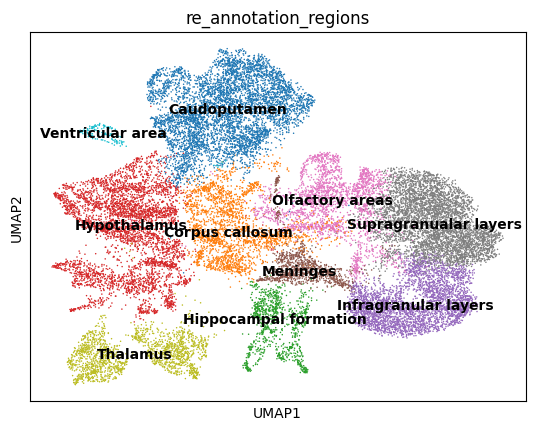

In [5]:
sc.pl.umap(adata, color = 're_annotation_regions', legend_loc = 'on data')

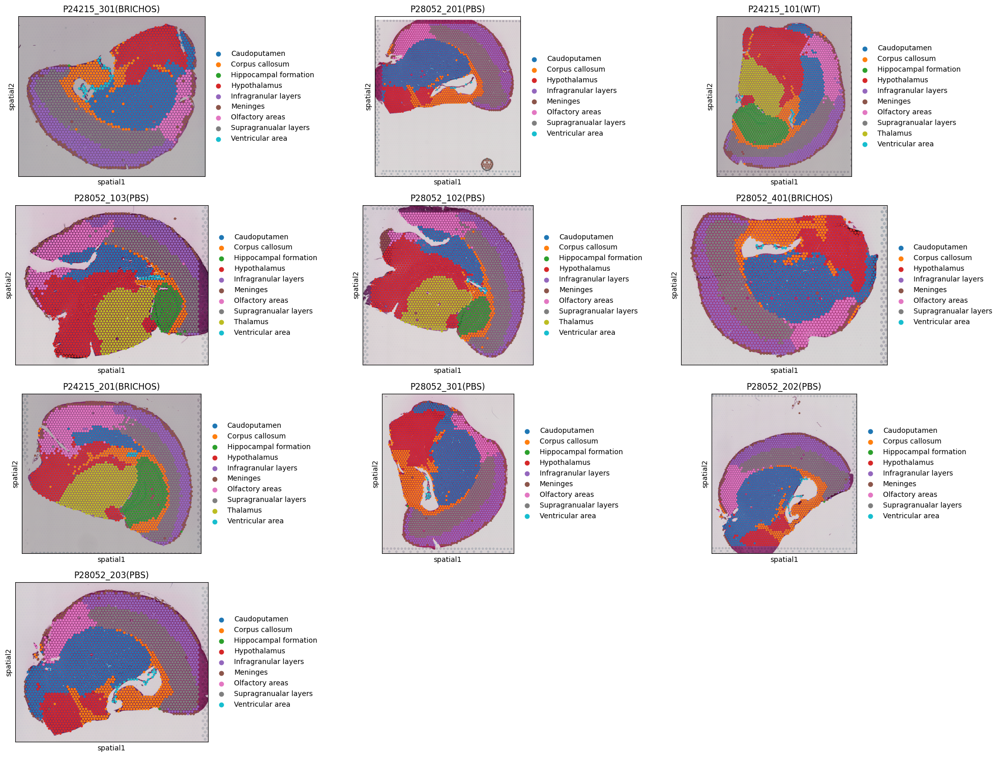

In [6]:
plot_spatial_clusters_per_sample(adata, color = 're_annotation_regions', figsize=(20,15), )

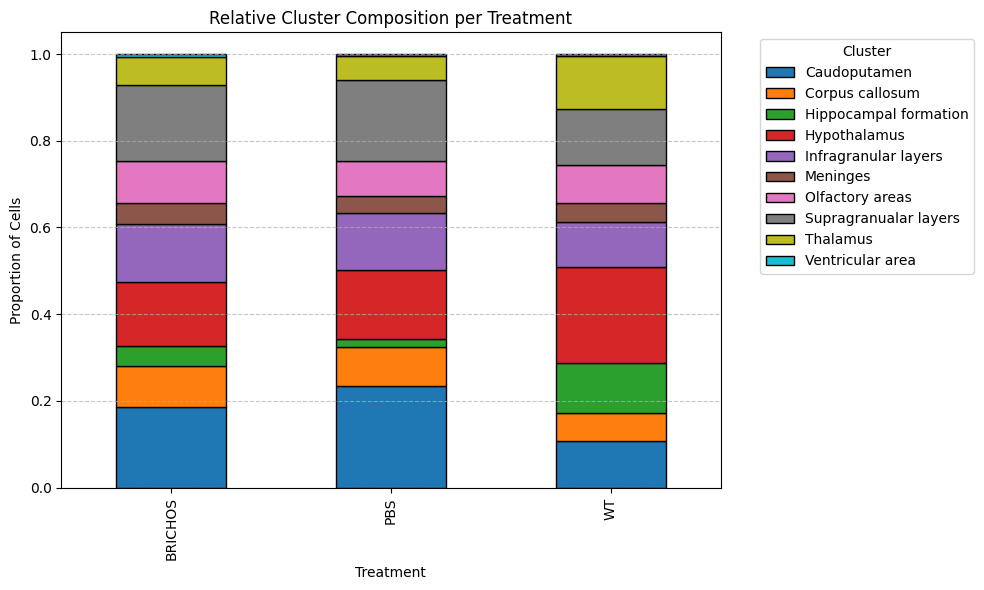

In [7]:
plot_relative_cluster_composition(adata, cluster_key="re_annotation_regions")

In [8]:
pig_genes = ['Abi3',
  'Apoe',
  'Axl',
  'B2m',
  'C1qa',
  'C1qb',
  'C1qc',
  'C3ar1',
  'C4b',
  'Ccl6',
  'Cd33',
  'Cd68',
  'Cd9',
  'Csf1',
  'Csf1r',
  'Cst7',
  'Ctss',
  'Ctsb',
  'Ctsd',
  'Cyba',
  'Cyp27a1',
  'Dock2',
  'Fcgr1',
  'Fcgr2b',
  'Fcgr3',
  'Fcer1g',
  'Fcrls',
  'Gpnmb',
  'Grn',
  'Gusb',
  'Hexb',
  'H2-Ab1',
  'H2-Eb1',
  'H2-Aa',
  'Itgax',
  'Laptm5',
  'Lgmn',
  'Lyz2',
  'Mpeg1',
  'Msr1',
  'Pf4',
  'Plek',
  'Prdx6',
  'Psap',
  'S100a4',
  'S100a6',
  'S100a11',
  'Spp1',
  'Timp2',
  'Trem2',
  'Tyrobp',
  'Vim',
  'Vsir']

In [9]:
import numpy as np
import pandas as pd
import scanpy as sc

# ensure the genes exist
genes_in_data = [g for g in pig_genes if g in adata.var_names]
print(f"{len(genes_in_data)} plaque genes found in dataset")

# compute per-cell plaque score
adata.obs["plaque_score"] = adata[:, genes_in_data].X.mean(1).A1 \
    if hasattr(adata[:, genes_in_data].X, "A1") else adata[:, genes_in_data].X.mean(1)

53 plaque genes found in dataset


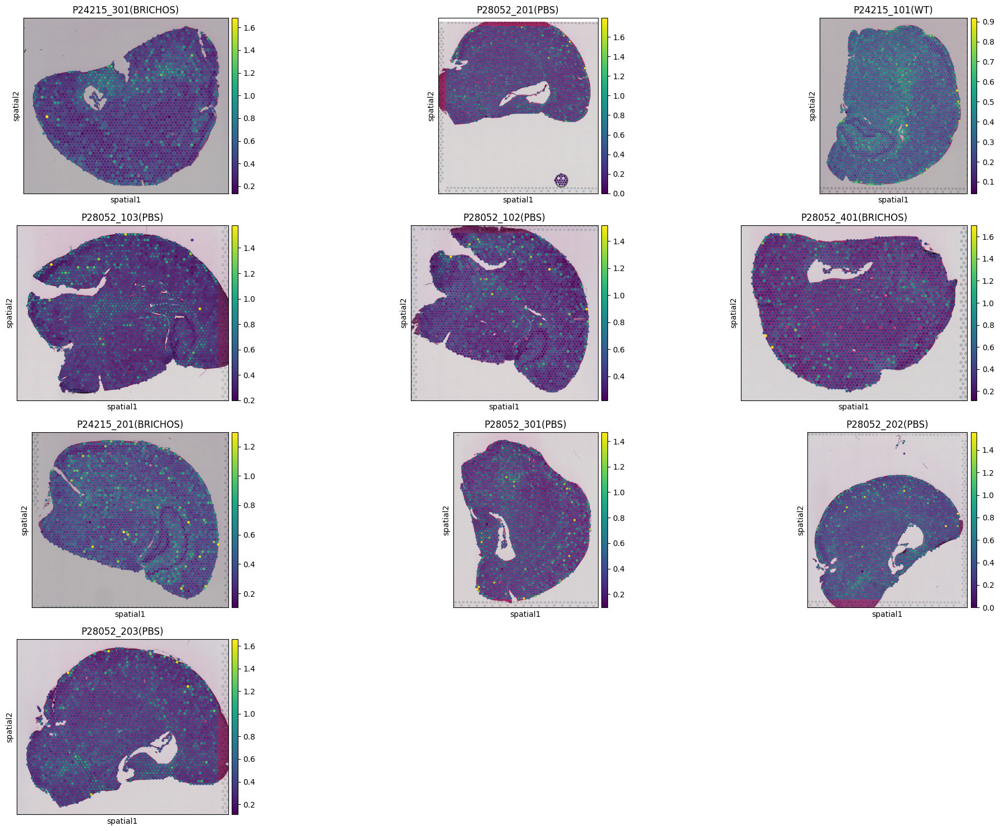

In [10]:
plot_spatial_clusters_per_sample(adata, color = 'plaque_score', figsize=(20,15))

In [11]:
df = (
    adata.obs
    .groupby(["re_annotation_regions", "treatment"])["plaque_score"]
    .mean()
    .reset_index()
)

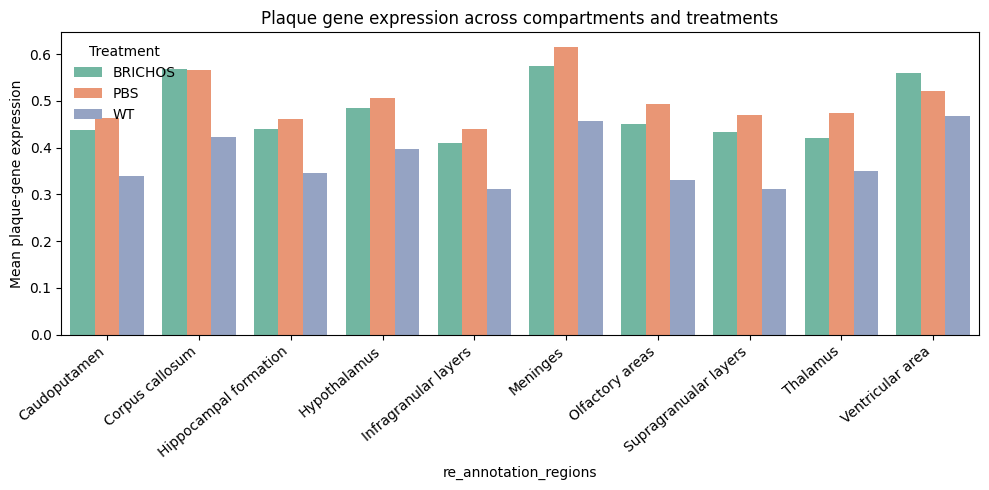

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.barplot(
    data=df,
    x="re_annotation_regions", y="plaque_score",
    hue="treatment", palette="Set2",
)
plt.xticks(rotation=40, ha="right")
plt.ylabel("Mean plaque-gene expression")
plt.title("Plaque gene expression across compartments and treatments")
plt.legend(title="Treatment", frameon=False)
plt.tight_layout()
plt.show()

In [13]:
adata

AnnData object with n_obs × n_vars = 25660 × 18751
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample', 'sample_id', 'n_genes', 'leiden', 'treatment', 'barcode', 'region_annotation', 'leiden_0.5', 'leiden_0.75', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'PIG_score', 'OLIG_score', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 're_annotation_regions', 'plaque_score'
    var: 'n_cells'
    uns: 'dendrogram_treatment', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.3_colors', 'leiden_0.5_colors', 'leiden_0.75_colors', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2.5_colors', 'leiden_2_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'region_annotation_colors', 'sample_id_colors', 'spatial', 'spatial_metadata_per_sample', 'umap', 're_annotation_regions_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [14]:
import statsmodels.formula.api as smf
import pandas as pd

df = adata.obs.copy()
df["plaque_score"] = adata.obs["plaque_score"]
df = df.dropna(subset=["plaque_score", "treatment", "re_annotation_regions", "sample_id"])

# Example: mixed model with treatment + compartment and random intercept per mouse
model = smf.mixedlm(
    "plaque_score ~ treatment * re_annotation_regions",
    df,
    groups=df["sample_id"],
)
res = model.fit()
print(res.summary())

/Users/chrislangseth/miniforge3/envs/karospace311/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/chrislangseth/miniforge3/envs/karospace311/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


                                  Mixed Linear Model Regression Results
Model:                            MixedLM                 Dependent Variable:                 plaque_score
No. Observations:                 25660                   Method:                             REML        
No. Groups:                       10                      Scale:                              0.0172      
Min. group size:                  2201                    Log-Likelihood:                     15569.1990  
Max. group size:                  2957                    Converged:                          Yes         
Mean group size:                  2566.0                                                                  
----------------------------------------------------------------------------------------------------------
                                                                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------

/Users/chrislangseth/miniforge3/envs/karospace311/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/chrislangseth/miniforge3/envs/karospace311/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [15]:
significant = (
    res.pvalues[res.pvalues < 0.05]
    .rename("pval")
    .reset_index()
    .query("index.str.contains('treatment') and index.str.contains('re_annotation_regions')")
)
print(significant)

                                                index      pval
9   treatment[T.PBS]:re_annotation_regions[T.Corpu...  0.000027
10  treatment[T.WT]:re_annotation_regions[T.Corpus...  0.000261
11  treatment[T.PBS]:re_annotation_regions[T.Hippo...  0.000168
12  treatment[T.PBS]:re_annotation_regions[T.Hypot...  0.002982
13  treatment[T.WT]:re_annotation_regions[T.Olfact...  0.019934
14  treatment[T.WT]:re_annotation_regions[T.Suprag...  0.027745
15  treatment[T.PBS]:re_annotation_regions[T.Ventr...  0.008698


In [16]:
significant

,index,pval
9,treatment[T.PBS]:re_annotation_regions[T.Corpu...,0.000027
10,treatment[T.WT]:re_annotation_regions[T.Corpus...,0.000261
11,treatment[T.PBS]:re_annotation_regions[T.Hippo...,0.000168
12,treatment[T.PBS]:re_annotation_regions[T.Hypot...,0.002982
13,treatment[T.WT]:re_annotation_regions[T.Olfact...,0.019934
14,treatment[T.WT]:re_annotation_regions[T.Suprag...,0.027745
15,treatment[T.PBS]:re_annotation_regions[T.Ventr...,0.008698


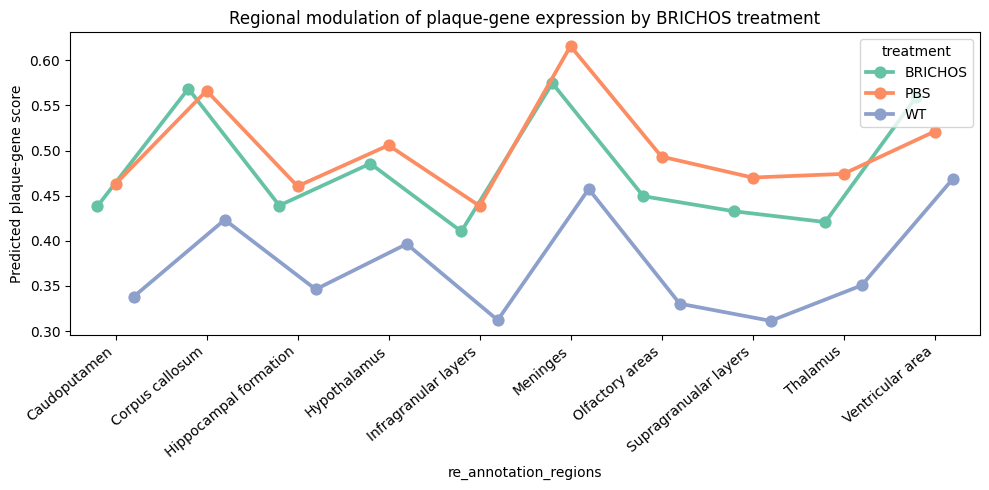

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Get estimated marginal means (model predictions)
pred_df = df.groupby(["treatment", "re_annotation_regions"])["plaque_score"].mean().reset_index()

plt.figure(figsize=(10,5))
sns.pointplot(
    data=pred_df,
    x="re_annotation_regions", y="plaque_score",
    hue="treatment", dodge=0.4, markers="o", capsize=0.1,
    palette="Set2"
)
plt.xticks(rotation=40, ha="right")
plt.ylabel("Predicted plaque-gene score")
plt.title("Regional modulation of plaque-gene expression by BRICHOS treatment")
plt.tight_layout()
plt.show()

In [18]:
import pandas as pd

# Extract coefficients and p-values from the mixed model
summary = pd.DataFrame({
    "coef": res.params,
    "pval": res.pvalues
})

# Filter for treatment × region interactions
pbs_interactions = summary.loc[summary.index.str.contains("treatment\[T.PBS\]:re_annotation_regions")].copy()

# Clean region names for plotting
pbs_interactions["region"] = (
    pbs_interactions.index
    .str.extract(r"re_annotation_regions\[T\.(.+)\]")[0]
    .str.replace("_", " ")
)
pbs_interactions["sig"] = pbs_interactions["pval"] < 0.05
pbs_interactions.head()

,coef,pval,region,sig
treatment[T.PBS]:re_annotation_regions[T.Corpus callosum],-0.030844,0.000027,NaN,True
treatment[T.PBS]:re_annotation_regions[T.Hippocampal formation],-0.044235,0.000168,NaN,True
treatment[T.PBS]:re_annotation_regions[T.Hypothalamus],-0.019195,0.002982,NaN,True
treatment[T.PBS]:re_annotation_regions[T.Infragranular layers],-0.003309,0.615521,NaN,False
treatment[T.PBS]:re_annotation_regions[T.Meninges],0.008145,0.400462,NaN,False


In [19]:
from scipy.stats import mannwhitneyu, ttest_ind

results = []
for region in df["re_annotation_regions"].unique():
    sub = df[df["re_annotation_regions"] == region]
    pbs = sub.loc[sub["treatment"] == "PBS", "plaque_score"]
    bri = sub.loc[sub["treatment"] == "BRICHOS", "plaque_score"]
    stat, p = mannwhitneyu(pbs, bri, alternative="two-sided")
    results.append({"region": region, "pval": p, "mean_diff": bri.mean() - pbs.mean()})

pd.DataFrame(results).sort_values("pval")

,region,pval,mean_diff
2,Supragranualar layers,8.407791e-45,-0.037391
9,Thalamus,1.040621e-36,-0.053348
4,Caudoputamen,1.731127e-26,-0.024791
3,Infragranular layers,8.333421e-14,-0.028291
1,Hypothalamus,1.007587e-13,-0.020287
0,Olfactory areas,1.865815e-10,-0.043833
5,Meninges,6.990542e-03,-0.041166
8,Hippocampal formation,2.123546e-02,-0.021351
6,Corpus callosum,3.166712e-02,0.002191
7,Ventricular area,4.621177e-02,0.038486


In [20]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('plaque_score ~ treatment * re_annotation_regions', data=df).fit()
sm.stats.anova_lm(model, typ=2)

,sum_sq,df,F,PR(>F)
treatment,40.681782,2.0,1172.694107,0.000000e+00
re_annotation_regions,50.033340,9.0,320.502752,0.000000e+00
treatment:re_annotation_regions,1.940301,18.0,6.214575,1.547535e-15
Residual,444.563529,25630.0,NaN,NaN


In [21]:
import pandas as pd
from scipy.stats import mannwhitneyu

pb = (
    adata.obs
    .groupby(["sample_id", "treatment", "re_annotation_regions"])["plaque_score"]
    .mean()
    .reset_index()
)

rows = []
for region in pb["re_annotation_regions"].unique():
    sub = pb[pb["re_annotation_regions"] == region]
    # make sure we have both groups
    if set(sub["treatment"]) >= {"PBS", "BRICHOS"}:
        pbs = sub.loc[sub["treatment"] == "PBS", "plaque_score"]
        bri = sub.loc[sub["treatment"] == "BRICHOS", "plaque_score"]
        stat, p = mannwhitneyu(pbs, bri, alternative="two-sided")
        rows.append({
            "region": region,
            "n_PBS": len(pbs),
            "n_BRICHOS": len(bri),
            "mean_PBS": pbs.mean(),
            "mean_BRICHOS": bri.mean(),
            "Δ_BRICHOS_minus_PBS": bri.mean() - pbs.mean(),
            "pval": p,
        })

res_region = pd.DataFrame(rows).sort_values("pval")
res_region["p_adj_fdr"] = pd.Series(
    pd.Series(res_region["pval"]).rank(method="first")  # placeholder for order
)
# proper FDR:
from statsmodels.stats.multitest import multipletests
res_region["p_adj_fdr"] = multipletests(res_region["pval"], method="fdr_bh")[1]

res_region

,region,n_PBS,n_BRICHOS,mean_PBS,mean_BRICHOS,Δ_BRICHOS_minus_PBS,pval,p_adj_fdr
0,Caudoputamen,10,10,0.469166,0.441593,-0.027573,NaN,NaN
1,Corpus callosum,10,10,0.573254,0.573357,0.000102,NaN,NaN
2,Hippocampal formation,10,10,0.450289,0.441971,-0.008319,NaN,NaN
3,Hypothalamus,10,10,0.503778,0.490001,-0.013776,NaN,NaN
4,Infragranular layers,10,10,0.439275,0.410121,-0.029154,NaN,NaN
5,Meninges,10,10,0.618533,0.575058,-0.043475,NaN,NaN
6,Olfactory areas,10,10,0.485669,0.450574,-0.035095,NaN,NaN
7,Supragranualar layers,10,10,0.469846,0.430420,-0.039426,NaN,NaN
8,Thalamus,10,10,0.474149,0.420801,-0.053348,NaN,NaN
9,Ventricular area,10,10,0.521741,0.541773,0.020032,NaN,NaN


In [22]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

rows = []
for region in pb["re_annotation_regions"].unique():
    sub = pb[pb["re_annotation_regions"] == region]
    # need at least 2 treatments
    if sub["treatment"].nunique() < 2:
        continue
    model = ols("plaque_score ~ C(treatment)", data=sub).fit()
    aov = sm.stats.anova_lm(model, typ=2)
    rows.append({
        "region": region,
        "pval": aov["PR(>F)"]["C(treatment)"],
        "n": len(sub),
        "means": sub.groupby("treatment")["plaque_score"].mean().to_dict()
    })

res_aov = pd.DataFrame(rows).sort_values("pval")
# FDR
from statsmodels.stats.multitest import multipletests
res_aov["p_adj_fdr"] = multipletests(res_aov["pval"], method="fdr_bh")[1]
res_aov

,region,pval,n,means,p_adj_fdr
4,Infragranular layers,0.000002,30,"{'BRICHOS': 0.41012081503868103, 'PBS': 0.4392...",0.000024
7,Supragranualar layers,0.000069,30,"{'BRICHOS': 0.430419921875, 'PBS': 0.469845920...",0.000347
0,Caudoputamen,0.001179,30,"{'BRICHOS': 0.4415926933288574, 'PBS': 0.46916...",0.003930
8,Thalamus,0.002902,30,"{'BRICHOS': 0.4208014905452728, 'PBS': 0.47414...",0.007255
5,Meninges,0.025554,30,"{'BRICHOS': 0.5750579833984375, 'PBS': 0.61853...",0.051107
3,Hypothalamus,0.032243,30,"{'BRICHOS': 0.4900014102458954, 'PBS': 0.50377...",0.053739
1,Corpus callosum,0.072494,30,"{'BRICHOS': 0.573356568813324, 'PBS': 0.573254...",0.094557
6,Olfactory areas,0.075646,30,"{'BRICHOS': 0.4505736827850342, 'PBS': 0.48566...",0.094557
9,Ventricular area,0.436050,30,"{'BRICHOS': 0.5417734980583191, 'PBS': 0.52174...",0.484500
2,Hippocampal formation,0.690540,30,"{'BRICHOS': 0.4419708847999573, 'PBS': 0.45028...",0.690540


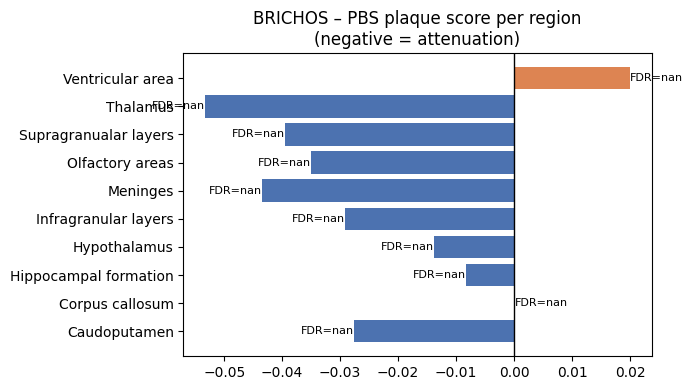

In [23]:
import matplotlib.pyplot as plt

sig = res_region.sort_values("p_adj_fdr").head(10)

plt.figure(figsize=(7, 4))
plt.barh(sig["region"], sig["Δ_BRICHOS_minus_PBS"], color=[
    "#4c72b0" if d < 0 else "#dd8452" for d in sig["Δ_BRICHOS_minus_PBS"]
])
plt.axvline(0, color="k", lw=1)
for i, (r, p) in enumerate(zip(sig["region"], sig["p_adj_fdr"])):
    plt.text(
        sig["Δ_BRICHOS_minus_PBS"].iloc[i],
        i,
        f"FDR={p:.3f}",
        va="center",
        ha="left" if sig["Δ_BRICHOS_minus_PBS"].iloc[i] > 0 else "right",
        fontsize=8,
    )
plt.title("BRICHOS – PBS plaque score per region\n(negative = attenuation)")
plt.tight_layout()
plt.show()

In [24]:
import pandas as pd
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
import numpy as np

# --- Pseudobulk plaque score per mouse × region ---
pb = (
    adata.obs
    .groupby(["sample_id", "treatment", "re_annotation_regions"])["plaque_score"]
    .mean()
    .reset_index()
)

rows = []
for region in pb["re_annotation_regions"].unique():
    sub = pb[pb["re_annotation_regions"] == region]

    # Require both groups to exist and at least 2 mice per group
    if set(sub["treatment"]) >= {"PBS", "BRICHOS"}:
        pbs = sub.loc[sub["treatment"] == "PBS", "plaque_score"].dropna()
        bri = sub.loc[sub["treatment"] == "BRICHOS", "plaque_score"].dropna()
        if len(pbs) >= 2 and len(bri) >= 2:
            stat, p = mannwhitneyu(pbs, bri, alternative="two-sided")
            rows.append({
                "region": region,
                "n_PBS": len(pbs),
                "n_BRICHOS": len(bri),
                "mean_PBS": pbs.mean(),
                "mean_BRICHOS": bri.mean(),
                "Δ_BRICHOS_minus_PBS": bri.mean() - pbs.mean(),
                "pval": p,
            })

res_region = pd.DataFrame(rows)

# --- Handle missing / constant cases safely ---
res_region = res_region.replace([np.inf, -np.inf], np.nan).dropna(subset=["pval"])
if len(res_region) > 0:
    res_region["p_adj_fdr"] = multipletests(res_region["pval"], method="fdr_bh")[1]
else:
    res_region["p_adj_fdr"] = np.nan

# Sort by raw p-value
res_region = res_region.sort_values("pval")
res_region

,region,n_PBS,n_BRICHOS,mean_PBS,mean_BRICHOS,Δ_BRICHOS_minus_PBS,pval,p_adj_fdr
4,Infragranular layers,6,3,0.439275,0.410121,-0.029154,0.023810,0.107143
7,Supragranualar layers,6,3,0.469846,0.430420,-0.039426,0.023810,0.107143
0,Caudoputamen,6,3,0.469166,0.441593,-0.027573,0.095238,0.285714
5,Meninges,6,3,0.618533,0.575058,-0.043475,0.166667,0.375000
3,Hypothalamus,6,3,0.503778,0.490001,-0.013776,0.547619,0.821429
8,Ventricular area,6,3,0.521741,0.541773,0.020032,0.547619,0.821429
1,Corpus callosum,6,3,0.573254,0.573357,0.000102,0.714286,0.918367
2,Hippocampal formation,5,2,0.450289,0.441971,-0.008319,0.857143,0.964286
6,Olfactory areas,6,3,0.485669,0.450574,-0.035095,1.000000,1.000000


In [25]:
res_region[["region", "pval", "p_adj_fdr", "Δ_BRICHOS_minus_PBS"]].sort_values("pval").head(10)

,region,pval,p_adj_fdr,Δ_BRICHOS_minus_PBS
4,Infragranular layers,0.023810,0.107143,-0.029154
7,Supragranualar layers,0.023810,0.107143,-0.039426
0,Caudoputamen,0.095238,0.285714,-0.027573
5,Meninges,0.166667,0.375000,-0.043475
3,Hypothalamus,0.547619,0.821429,-0.013776
8,Ventricular area,0.547619,0.821429,0.020032
1,Corpus callosum,0.714286,0.918367,0.000102
2,Hippocampal formation,0.857143,0.964286,-0.008319
6,Olfactory areas,1.000000,1.000000,-0.035095


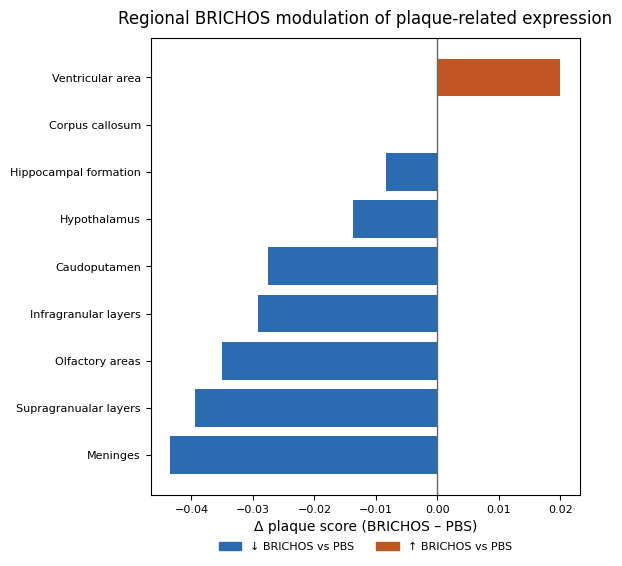

In [26]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

plot_df = res_region.sort_values("Δ_BRICHOS_minus_PBS")

colors = plot_df["Δ_BRICHOS_minus_PBS"].map(
    lambda d: "#2b6cb0" if d < 0 else "#c05621"
)

fig, ax = plt.subplots(figsize=(6, 3.5 + 0.25 * len(plot_df)))
ax.barh(plot_df["region"], plot_df["Δ_BRICHOS_minus_PBS"], color=colors)
ax.axvline(0, color="0.4", lw=1)

ax.set_xlabel("Δ plaque score (BRICHOS – PBS)")
ax.set_ylabel("")
ax.set_title("Regional BRICHOS modulation of plaque-related expression", pad=10)
ax.tick_params(axis="y", labelsize=8)
ax.tick_params(axis="x", labelsize=8)

atten_patch = mpatches.Patch(color="#2b6cb0", label="↓ BRICHOS vs PBS")
inc_patch   = mpatches.Patch(color="#c05621", label="↑ BRICHOS vs PBS")

ax.legend(
    handles=[atten_patch, inc_patch],
    loc="upper center",
    bbox_to_anchor=(0.5, -0.08),
    ncol=2,
    frameon=False,
    fontsize=8,
)

plt.tight_layout()
plt.show()

In [27]:
import numpy as np
import pandas as pd
import scanpy as sc

from anndata import AnnData
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# ------------------------------------------------
# 1) PSEUDOBULK: mouse × compartment
# ------------------------------------------------
def make_pseudobulk_by_compartment(
    adata,
    compartment_col="re_annotation_regions",   # your compartment / region column
    sample_id_col="mouse_id",                  # per-animal identifier
    condition_col="treatment",                 # WT / PBS / BRICHOS
    layer=None,                                # e.g. "counts" if present, else use .X
):
    # pick matrix
    if layer is not None and layer in adata.layers:
        X = adata.layers[layer]
    else:
        X = adata.X

    # we’ll aggregate genes per (mouse, compartment)
    obs = adata.obs[[sample_id_col, condition_col, compartment_col]].copy()
    obs = obs.astype(str)

    # build a “bulk sample id”
    obs["bulk_id"] = (
        obs[sample_id_col] + "|" +
        obs[condition_col] + "|" +
        obs[compartment_col]
    )

    bulk_ids = obs["bulk_id"].values
    uniq_bulk = pd.Index(np.unique(bulk_ids), name="bulk_id")

    # map each cell → bulk col
    codes = pd.Categorical(bulk_ids, categories=uniq_bulk).codes

    n_genes = adata.n_vars
    n_bulk  = len(uniq_bulk)

    # make dense-ish array for aggregation
    # (if data is big & sparse you can optimize, but this is clear)
    if hasattr(X, "tocsr"):
        X = X.tocsr()

    M = np.zeros((n_genes, n_bulk), dtype=np.int64)
    for j in range(n_bulk):
        idx = np.where(codes == j)[0]
        if len(idx) == 0:
            continue
        Xi = X[idx]
        if hasattr(Xi, "sum"):
            M[:, j] = Xi.sum(axis=0).A.ravel() if hasattr(Xi, "A") else Xi.sum(axis=0)
        else:
            M[:, j] = Xi.sum(0)

    # build metadata
    meta = (
        uniq_bulk.to_series()
        .str.split("|", expand=True)
        .rename(columns={0: sample_id_col, 1: condition_col, 2: compartment_col})
    )
    meta.index = uniq_bulk

    counts_df = pd.DataFrame(M, index=adata.var_names, columns=uniq_bulk)
    return counts_df, meta


# ------------------------------------------------
# 2) RUN DESEQ2 PER COMPARTMENT
# ------------------------------------------------
def run_dge_per_compartment(
    counts_df: pd.DataFrame,
    meta_df: pd.DataFrame,
    condition_col="treatment",
    ref="WT",
    contrast_levels=("PBS", "BRICHOS"),
):
    """
    For every compartment present in meta_df, run DESeq2
    on the pseudobulk samples from that compartment only.

    Returns: dict[compartment] = {level: results_df}
    """
    inference = DefaultInference(n_cpus=8)
    out = {}

    compartments = meta_df["re_annotation_regions"].unique()
    for comp in compartments:
        # subset to this compartment
        mask = meta_df["re_annotation_regions"] == comp
        meta_sub = meta_df.loc[mask].copy()
        if meta_sub.shape[0] < 3:
            # too few samples — skip
            continue
        cols_sub = meta_sub.index
        cts_sub = counts_df[cols_sub]

        # make AnnData (samples x genes)
        ad = AnnData(X=cts_sub.T.values)
        ad.var_names = cts_sub.index
        ad.obs_names = cts_sub.columns
        ad.obs = meta_sub.copy()

        # make condition categorical with ref level
        ad.obs[condition_col] = ad.obs[condition_col].astype(str)
        # keep only conditions we actually have
        present = ad.obs[condition_col].unique().tolist()
        # require reference to be present
        if ref not in present:
            # e.g. maybe in this region you only have PBS+BRICHOS
            # then set ref to the first
            ref_use = present[0]
        else:
            ref_use = ref

        ad.obs[condition_col] = pd.Categorical(
            ad.obs[condition_col],
            categories=[ref_use] + [p for p in present if p != ref_use],
            ordered=True,
        )

        # build DESeq2 object
        dds = DeseqDataSet(
            adata=ad,
            design_factors=[condition_col],
            refit_cooks=True,
            inference=inference,
        )
        dds.deseq2()

        # run desired contrasts
        comp_res = {}
        for lvl in contrast_levels:
            if lvl not in present:
                continue
            stat_res = DeseqStats(
                dds,
                contrast=[condition_col, lvl, ref_use],
                inference=inference,
            )
            stat_res.summary()
            df_res = stat_res.results_df.copy()
            df_res["compartment"] = comp
            df_res["contrast"] = f"{lvl}_vs_{ref_use}"
            comp_res[f"{lvl}_vs_{ref_use}"] = df_res

        out[comp] = comp_res

    return out




In [28]:
# ------------------------------------------------
# 3) PUT IT TOGETHER
# ------------------------------------------------
# assuming you already have:
#   adata.obs["mouse_id"]
#   adata.obs["treatment"]  (e.g. WT / PBS / BRICHOS)
#   adata.obs["re_annotation_regions"]

counts_df, meta_df = make_pseudobulk_by_compartment(
    adata,
    compartment_col="re_annotation_regions",
    sample_id_col="sample_id",
    condition_col="treatment",
    layer="counts",
)

# --- Contrasts vs WT (baseline pathology) ---
dge_by_comp = run_dge_per_compartment(
    counts_df,
    meta_df,
    condition_col="treatment",
    ref="WT",
    contrast_levels=("PBS", "BRICHOS"),
)

# --- BRICHOS vs PBS (treatment effect) ---
dge_bri_vs_pbs = run_dge_per_compartment(
    counts_df,
    meta_df,
    condition_col="treatment",
    ref="PBS",
    contrast_levels=("BRICHOS",),
)

# Merge BRICHOS_vs_PBS into dge_by_comp
for comp, contrasts in dge_bri_vs_pbs.items():
    if comp not in dge_by_comp:
        dge_by_comp[comp] = {}
    dge_by_comp[comp].update(contrasts)

print("Contrasts available per region:")
for comp, contrasts in dge_by_comp.items():
    print(f"  {comp}: {list(contrasts.keys())}")


Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.86 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 1.02 seconds.

Fitting LFCs...
... done in 0.88 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           123.342978       -0.035825  0.283180 -0.126510  0.899328   
Rp1              1.617612       -0.248500  1.943514 -0.127861  0.898259   
Sox17           87.436554        0.393608  0.308591  1.275501  0.202132   
Lypla1         209.778427       -0.036203  0.187644 -0.192936  0.847009   
Tcea1          706.216467       -0.177434  0.130374 -1.360961  0.173526   
...                   ...             ...       ...       ...       ...   
Arhgap6        255.377618       -0.154717  0.233755 -0.661877  0.508050   
Hccs           358.723891       -0.113406  0.168751 -0.672033  0.501562   
Mid1            55.598745        0.536101  0.831344  0.644860  0.519018   
4933400A11Rik    0.205837       -0.548959  5.342878 -0.102746  0.918165   
Asmt             1.732239       -0.597010  1.818521 -0.328294  0.742689   

                   padj  
Xkr4           

... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           123.342978       -0.154638  0.305321 -0.506478  0.612521   
Rp1              1.617612       -0.373718  2.104279 -0.177599  0.859038   
Sox17           87.436554        0.319982  0.327689  0.976481  0.328826   
Lypla1         209.778427       -0.224263  0.202530 -1.107307  0.268161   
Tcea1          706.216467       -0.163221  0.140457 -1.162071  0.245207   
...                   ...             ...       ...       ...       ...   
Arhgap6        255.377618        0.008358  0.250943  0.033306  0.973431   
Hccs           358.723891       -0.052785  0.181341 -0.291080  0.770990   
Mid1            55.598745        0.794292  0.886975  0.895506  0.370516   
4933400A11Rik    0.205837        0.660308  5.629045  0.117304  0.906619   
Asmt             1.732239       -0.133062  1.937043 -0.068693  0.945234   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.75 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.95 seconds.

Fitting LFCs...
... done in 0.82 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            37.696944        0.596387  0.468423  1.273179  0.202954   
Rp1              5.241982       -0.673863  1.040286 -0.647767  0.517136   
Sox17           25.572014       -0.347822  0.499832 -0.695878  0.486505   
Lypla1          86.176775       -0.123528  0.279594 -0.441813  0.658625   
Tcea1          230.670183       -0.098800  0.199388 -0.495520  0.620233   
...                   ...             ...       ...       ...       ...   
Arhgap6         43.805800        0.736361  0.755521  0.974640  0.329739   
Hccs           139.121598        0.040372  0.252104  0.160140  0.872771   
Mid1            17.838779        0.655427  0.796633  0.822746  0.410652   
4933400A11Rik    0.243235       -0.246300  6.050405 -0.040708  0.967529   
Asmt             0.189645       -0.260843  5.566959 -0.046856  0.962628   

                   padj  
Xkr4           

... done in 0.47 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            37.696944        0.532235  0.494845  1.075559  0.282125   
Rp1              5.241982       -0.147876  1.107822 -0.133484  0.893811   
Sox17           25.572014       -0.739286  0.547825 -1.349493  0.177179   
Lypla1          86.176775        0.006273  0.298599  0.021008  0.983240   
Tcea1          230.670183       -0.020714  0.213304 -0.097110  0.922639   
...                   ...             ...       ...       ...       ...   
Arhgap6         43.805800        1.082251  0.800168  1.352531  0.176206   
Hccs           139.121598       -0.005235  0.269971 -0.019391  0.984529   
Mid1            17.838779        0.239263  0.851773  0.280900  0.778787   
4933400A11Rik    0.243235        0.509092  6.400824  0.079535  0.936607   
Asmt             0.189645        0.387504  5.890819  0.065781  0.947552   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.91 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.87 seconds.

Fitting LFCs...
... done in 1.79 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            6.556735        0.265512  1.340201  0.198114  0.842956   
Rp1             0.043800        2.080260  1.825529  1.139538  0.254479   
Sox17           5.456023        0.373736  1.531796  0.243985  0.807242   
Lypla1          5.996776       -0.243578  1.349547 -0.180489  0.856769   
Tcea1          25.428905        0.127208  1.167054  0.108999  0.913203   
...                  ...             ...       ...       ...       ...   
Arhgap6         6.743002        2.192596  1.733801  1.264618  0.206008   
Hccs            7.520052       -0.030770  1.364272 -0.022554  0.982006   
Mid1            5.804476        1.695400  1.463443  1.158501  0.246660   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.032647        1.366183  1.771837  0.771055  0.440675   

                   padj  
Xkr4           0.999992  
R

... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            6.556735        0.051608  1.570827  0.032854  0.973791   
Rp1             0.043800        2.445179  2.030903  1.203986  0.228595   
Sox17           5.456023        0.988571  1.765188  0.560037  0.575454   
Lypla1          5.996776       -0.520174  1.584490 -0.328291  0.742691   
Tcea1          25.428905       -0.541378  1.374977 -0.393736  0.693776   
...                  ...             ...       ...       ...       ...   
Arhgap6         6.743002       -0.077684  2.104195 -0.036919  0.970550   
Hccs            7.520052       -0.107010  1.594075 -0.067130  0.946478   
Mid1            5.804476       -0.004992  1.753480 -0.002847  0.997729   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.032647        1.659315  1.999879  0.829707  0.406704   

                   padj  
Xkr4           0.999973

Fitting dispersions...
... done in 0.89 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 1.04 seconds.

Fitting LFCs...
... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.51 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            92.250268        0.037378  0.204314  0.182946  0.854840   
Rp1              1.596225       -0.468572  1.525483 -0.307163  0.758719   
Sox17           61.642162       -0.005834  0.265354 -0.021985  0.982460   
Lypla1         178.133458       -0.354332  0.165155 -2.145455  0.031917   
Tcea1          462.800933       -0.035617  0.111611 -0.319117  0.749638   
...                   ...             ...       ...       ...       ...   
Arhgap6        182.243839        0.532255  0.199889  2.662750  0.007751   
Hccs           276.696939        0.053296  0.138906  0.383685  0.701212   
Mid1            38.198175        0.595522  0.649186  0.917337  0.358966   
4933400A11Rik    0.097253       -1.408706  5.275836 -0.267011  0.789461   
Asmt             1.075546       -1.203140  1.825833 -0.658954  0.509925   

                   padj  
Xkr4           

... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            92.250268       -0.146077  0.232539 -0.628183  0.529884   
Rp1              1.596225       -0.828803  1.769428 -0.468402  0.639497   
Sox17           61.642162        0.093083  0.295394  0.315115  0.752674   
Lypla1         178.133458       -0.418009  0.185243 -2.256545  0.024037   
Tcea1          462.800933       -0.104277  0.123899 -0.841630  0.399995   
...                   ...             ...       ...       ...       ...   
Arhgap6        182.243839        0.106119  0.222009  0.477994  0.632655   
Hccs           276.696939        0.125865  0.153495  0.819994  0.412219   
Mid1            38.198175        0.365418  0.703363  0.519529  0.603392   
4933400A11Rik    0.097253       -1.142980  5.798018 -0.197133  0.843724   
Asmt             1.075546       -0.309301  1.990959 -0.155353  0.876543   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.76 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 1.05 seconds.

Fitting LFCs...
... done in 0.66 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.50 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           108.755813        0.043316  0.262071  0.165284  0.868720   
Rp1              0.915216       -1.293173  2.017474 -0.640986  0.521532   
Sox17           65.536291       -0.121472  0.298416 -0.407056  0.683967   
Lypla1         213.867050        0.115689  0.169488  0.682582  0.494871   
Tcea1          483.649482       -0.247159  0.135962 -1.817849  0.069087   
...                   ...             ...       ...       ...       ...   
Arhgap6         34.545104       -0.157088  0.379678 -0.413741  0.679064   
Hccs           256.070915        0.086993  0.160868  0.540773  0.588664   
Mid1            48.500277        1.280087  0.836813  1.529717  0.126087   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.445179       -0.621209  1.686881 -0.368259  0.712680   

                   padj  
Xkr4           

... done in 0.44 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           108.755813       -0.056126  0.282551 -0.198639  0.842545   
Rp1              0.915216       -2.461151  2.459268 -1.000766  0.316940   
Sox17           65.536291       -0.330348  0.324827 -1.016997  0.309155   
Lypla1         213.867050       -0.046928  0.183274 -0.256052  0.797911   
Tcea1          483.649482       -0.348916  0.146865 -2.375751  0.017513   
...                   ...             ...       ...       ...       ...   
Arhgap6         34.545104        0.050381  0.407021  0.123779  0.901490   
Hccs           256.070915        0.137463  0.172590  0.796474  0.425757   
Mid1            48.500277        1.438022  0.889378  1.616885  0.105903   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.445179       -0.981714  1.885231 -0.520739  0.602548   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.85 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            9.830483       -0.489709  0.612093 -0.800055  0.423679   
Rp1             0.400425        2.084718  4.286244  0.486374  0.626702   
Sox17          21.936771        0.361712  0.457507  0.790616  0.429168   
Lypla1         24.910572       -0.311060  0.405330 -0.767422  0.442831   
Tcea1          49.357963       -0.197902  0.299871 -0.659957  0.509281   
...                  ...             ...       ...       ...       ...   
Arhgap6        11.774344        0.458076  0.633639  0.722929  0.469723   
Hccs           27.335539       -0.226658  0.393544 -0.575940  0.564656   
Mid1            5.035137        1.886078  1.250691  1.508029  0.131547   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.195980        1.198317  5.184548  0.231132  0.817212   

                   padj  
Xkr4           0.999767  
R

... done in 0.50 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            9.830483       -0.670964  0.668901 -1.003084  0.315820   
Rp1             0.400425        0.193857  4.747072  0.040837  0.967426   
Sox17          21.936771       -0.034930  0.496046 -0.070417  0.943862   
Lypla1         24.910572       -0.435874  0.439544 -0.991651  0.321368   
Tcea1          49.357963       -0.277473  0.323599 -0.857457  0.391192   
...                  ...             ...       ...       ...       ...   
Arhgap6        11.774344        0.088837  0.684561  0.129772  0.896746   
Hccs           27.335539       -0.133690  0.421595 -0.317104  0.751164   
Mid1            5.035137        0.963618  1.333667  0.722533  0.469967   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.195980        0.193847  5.636306  0.034393  0.972564   

                   padj  
Xkr4           0.999616

Fitting dispersions...
... done in 0.76 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.97 seconds.

Fitting LFCs...
... done in 0.73 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            79.851498       -0.148433  0.279352 -0.531346  0.595179   
Rp1              0.508109       -1.804627  2.897288 -0.622868  0.533372   
Sox17           28.510139        0.448755  0.426177  1.052979  0.292351   
Lypla1          88.490969        0.001664  0.243846  0.006823  0.994556   
Tcea1          249.583859       -0.285550  0.169291 -1.686741  0.091653   
...                   ...             ...       ...       ...       ...   
Arhgap6         75.003432       -0.157282  0.265199 -0.593070  0.553134   
Hccs           124.616779       -0.179083  0.201481 -0.888833  0.374093   
Mid1            25.746919        1.421734  1.025601  1.386244  0.165673   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             0.592641        2.294902  4.071396  0.563665  0.572982   

                   padj  
Xkr4           

... done in 0.50 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            79.851498       -0.297403  0.302281 -0.983861  0.325184   
Rp1              0.508109       -0.396539  2.978242 -0.133145  0.894078   
Sox17           28.510139        0.130469  0.460744  0.283170  0.777047   
Lypla1          88.490969        0.004819  0.262176  0.018381  0.985335   
Tcea1          249.583859       -0.244172  0.182126 -1.340671  0.180027   
...                   ...             ...       ...       ...       ...   
Arhgap6         75.003432       -0.044194  0.284592 -0.155289  0.876594   
Hccs           124.616779       -0.093758  0.216555 -0.432952  0.665049   
Mid1            25.746919        0.726197  1.097863  0.661464  0.508315   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             0.592641        1.788745  4.256827  0.420206  0.674335   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.78 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.97 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           197.050711       -0.026077  0.197432 -0.132080  0.894921   
Rp1              1.709571       -1.157602  1.942941 -0.595799  0.551310   
Sox17           78.128413        0.447016  0.337492  1.324524  0.185329   
Lypla1         336.013970       -0.310686  0.154195 -2.014894  0.043916   
Tcea1          756.699876       -0.071870  0.114080 -0.629999  0.528695   
...                   ...             ...       ...       ...       ...   
Arhgap6         40.356647        0.153902  0.399801  0.384948  0.700276   
Hccs           419.383628       -0.092728  0.137420 -0.674777  0.499817   
Mid1            60.588647        0.610982  0.868971  0.703109  0.481988   
4933400A11Rik    0.208216       -0.454198  5.677129 -0.080005  0.936233   
Asmt             2.045591       -0.736412  1.455174 -0.506064  0.612811   

                   padj  
Xkr4           

... done in 0.50 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           197.050711       -0.080558  0.212809 -0.378546  0.705025   
Rp1              1.709571        1.237667  1.949359  0.634910  0.525487   
Sox17           78.128413        0.458862  0.359589  1.276074  0.201929   
Lypla1         336.013970       -0.414263  0.167203 -2.477606  0.013227   
Tcea1          756.699876       -0.082072  0.122703 -0.668865  0.503581   
...                   ...             ...       ...       ...       ...   
Arhgap6         40.356647        0.311783  0.426131  0.731659  0.464377   
Hccs           419.383628       -0.106439  0.148067 -0.718860  0.472227   
Mid1            60.588647        0.313979  0.929646  0.337741  0.735559   
4933400A11Rik    0.208216        0.680102  5.968999  0.113939  0.909286   
Asmt             2.045591       -0.588837  1.589073 -0.370554  0.710970   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.51 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.76 seconds.

Fitting LFCs...
... done in 0.74 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           211.390065        0.051080  0.310027  0.164760  0.869133   
Rp1              3.347010       -1.208296  2.262803 -0.533982  0.593354   
Sox17           80.187379        0.326553  0.487591  0.669728  0.503031   
Lypla1         360.484315        0.047456  0.245724  0.193126  0.846860   
Tcea1          727.047147       -0.013736  0.182941 -0.075084  0.940148   
...                   ...             ...       ...       ...       ...   
Arhgap6         46.317460       -0.500651  0.628963 -0.795994  0.426035   
Hccs           398.325491        0.104730  0.233874  0.447802  0.654296   
Mid1            32.398606        1.027886  0.777418  1.322181  0.186108   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.511397        0.860380  3.465363  0.248280  0.803918   

                   padj  
Xkr4           

... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           211.390065        0.129752  0.362153  0.358280  0.720134   
Rp1              3.347010       -2.290463  2.897431 -0.790515  0.429227   
Sox17           80.187379       -0.161195  0.579254 -0.278280  0.780797   
Lypla1         360.484315        0.120501  0.286878  0.420043  0.674454   
Tcea1          727.047147       -0.087195  0.214322 -0.406840  0.684126   
...                   ...             ...       ...       ...       ...   
Arhgap6         46.317460       -0.416008  0.741370 -0.561135  0.574706   
Hccs           398.325491        0.104206  0.273425  0.381115  0.703118   
Mid1            32.398606        0.201375  0.923715  0.218006  0.827425   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.511397       -2.411225  5.117233 -0.471197  0.637500   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.62 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting LFCs...
... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            1.209901        2.713026  3.649825  0.743330  0.457282   
Rp1             1.132562        2.857892  3.670093  0.778697  0.436158   
Sox17           2.609723        1.520824  1.718243  0.885104  0.376101   
Lypla1         31.917165       -0.282734  0.436966 -0.647039  0.517606   
Tcea1          35.511925       -0.205209  0.394178 -0.520600  0.602645   
...                  ...             ...       ...       ...       ...   
Arhgap6         3.777857        0.137163  1.184931  0.115756  0.907846   
Hccs           17.134788        0.030657  0.569226  0.053857  0.957049   
Mid1            3.814977        0.860581  1.371028  0.627690  0.530207   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.000000             NaN       NaN       NaN       NaN   

                   padj  
Xkr4           0.999212  
R

... done in 0.50 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            1.209901        2.357621  3.740545  0.630288  0.528506   
Rp1             1.132562        1.877391  3.794937  0.494709  0.620805   
Sox17           2.609723        0.207857  1.856192  0.111980  0.910839   
Lypla1         31.917165        0.088936  0.465081  0.191227  0.848348   
Tcea1          35.511925       -0.262341  0.425016 -0.617248  0.537071   
...                  ...             ...       ...       ...       ...   
Arhgap6         3.777857       -0.257054  1.284637 -0.200099  0.841404   
Hccs           17.134788       -0.060274  0.611453 -0.098575  0.921476   
Mid1            3.814977        0.127188  1.479183  0.085985  0.931478   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.000000             NaN       NaN       NaN       NaN   

                   padj  
Xkr4           0.999491

Fitting dispersions...
... done in 0.89 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.97 seconds.

Fitting LFCs...
... done in 0.80 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.51 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  padj
Xkr4           123.342978       -0.118815  0.173516 -0.684751  0.493501   NaN
Rp1              1.617612       -0.125237  1.179185 -0.106207  0.915418   NaN
Sox17           87.436554       -0.073624  0.162103 -0.454181  0.649699   NaN
Lypla1         209.778427       -0.188056  0.111308 -1.689503  0.091123   NaN
Tcea1          706.216467        0.014216  0.081839  0.173710  0.862094   NaN
...                   ...             ...       ...       ...       ...   ...
Arhgap6        255.377618        0.163078  0.146136  1.115934  0.264450   NaN
Hccs           358.723891        0.060629  0.103079  0.588183  0.556409   NaN
Mid1            55.598745        0.258192  0.519083  0.497400  0.618907   NaN
4933400A11Rik    0.205837        1.209290  3.136389  0.385567  0.699817   NaN
Asmt             1.732239        0.463944  1.050746  0.441538  0.658824   NaN



Fitting dispersions...
... done in 0.75 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.99 seconds.

Fitting LFCs...
... done in 0.77 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            37.696944       -0.064154  0.240494 -0.266760  0.789654   
Rp1              5.241982        0.525992  0.638812  0.823391  0.410286   
Sox17           25.572014       -0.391459  0.328489 -1.191696  0.233381   
Lypla1          86.176775        0.129807  0.164117  0.790938  0.428980   
Tcea1          230.670183        0.078083  0.121382  0.643282  0.520041   
...                   ...             ...       ...       ...       ...   
Arhgap6         43.805800        0.345889  0.449390  0.769686  0.441486   
Hccs           139.121598       -0.045608  0.151429 -0.301183  0.763275   
Mid1            17.838779       -0.416164  0.460033 -0.904640  0.365656   
4933400A11Rik    0.243235        0.755386  3.650559  0.206923  0.836070   
Asmt             0.189645        0.648344  3.326781  0.194886  0.845482   

                   padj  
Xkr4      

Fitting dispersions...
... done in 0.89 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.86 seconds.

Fitting LFCs...
... done in 1.66 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.50 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            6.556735       -0.213728  1.277834 -0.167258  0.867167   
Rp1             0.043800        0.364048  1.586260  0.229501  0.818480   
Sox17           5.456023        0.618350  1.471825  0.420125  0.674394   
Lypla1          5.996776       -0.276598  1.284644 -0.215311  0.829525   
Tcea1          25.428905       -0.666409  1.059654 -0.628893  0.529419   
...                  ...             ...       ...       ...       ...   
Arhgap6         6.743002       -2.274890  1.711162 -1.329442  0.183702   
Hccs            7.520052       -0.076227  1.274293 -0.059819  0.952300   
Mid1            5.804476       -1.701768  1.443723 -1.178736  0.238503   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.032647        0.291331  1.647252  0.176859  0.859619   

                   padj  
Xkr4           0.99995

Fitting dispersions...
... done in 0.88 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.93 seconds.

Fitting LFCs...
... done in 0.76 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            92.250268       -0.183438  0.161396 -1.136568  0.255719   
Rp1              1.596225       -0.360151  1.278453 -0.281708  0.778167   
Sox17           61.642162        0.098903  0.200151  0.494143  0.621205   
Lypla1         178.133458       -0.063694  0.127935 -0.497864  0.618580   
Tcea1          462.800933       -0.068669  0.083042 -0.826929  0.408277   
...                   ...             ...       ...       ...       ...   
Arhgap6        182.243839       -0.426134  0.144965 -2.939565  0.003287   
Hccs           276.696939        0.072550  0.102182  0.710009  0.477698   
Mid1            38.198175       -0.230074  0.441785 -0.520782  0.602518   
4933400A11Rik    0.097253        0.265717  3.957885  0.067136  0.946473   
Asmt             1.075546        0.893883  1.435479  0.622707  0.533477   

                   padj  
Xkr4      

Fitting dispersions...
... done in 0.74 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.93 seconds.

Fitting LFCs...
... done in 0.73 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           108.755813       -0.099445  0.171348 -0.580367  0.561667   
Rp1              0.915216       -1.167988  1.850670 -0.631116  0.527964   
Sox17           65.536291       -0.208876  0.201733 -1.035408  0.300479   
Lypla1         213.867050       -0.162617  0.110476 -1.471966  0.141030   
Tcea1          483.649482       -0.101757  0.091109 -1.116866  0.264052   
...                   ...             ...       ...       ...       ...   
Arhgap6         34.545104        0.207471  0.246267  0.842464  0.399528   
Hccs           256.070915        0.050470  0.102962  0.490185  0.624003   
Mid1            48.500277        0.157935  0.518330  0.304700  0.760595   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.445179       -0.360497  1.260647 -0.285962  0.774907   

                   padj  
Xkr4      

Fitting dispersions...
... done in 0.66 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting LFCs...
... done in 0.65 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            9.830483       -0.181255  0.451781 -0.401202  0.688271   
Rp1             0.400425       -1.890857  2.660538 -0.710705  0.477267   
Sox17          21.936771       -0.396642  0.307091 -1.291610  0.196492   
Lypla1         24.910572       -0.124814  0.288908 -0.432021  0.665726   
Tcea1          49.357963       -0.079571  0.208932 -0.380843  0.703319   
...                  ...             ...       ...       ...       ...   
Arhgap6        11.774344       -0.369238  0.417301 -0.884825  0.376251   
Hccs           27.335539        0.092968  0.270857  0.343238  0.731419   
Mid1            5.035137       -0.922460  0.677378 -1.361809  0.173258   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.195980       -1.004467  3.316443 -0.302875  0.761985   

                   padj  
Xkr4           0.99955

Fitting dispersions...
... done in 0.72 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...
... done in 0.89 seconds.

Fitting LFCs...
... done in 0.78 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.44 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            79.851498       -0.148971  0.192679 -0.773159  0.439429   
Rp1              0.508109        1.408077  2.131663  0.660553  0.508899   
Sox17           28.510139       -0.318285  0.279996 -1.136748  0.255643   
Lypla1          88.490969        0.003154  0.164231  0.019207  0.984676   
Tcea1          249.583859        0.041380  0.115716  0.357596  0.720645   
...                   ...             ...       ...       ...       ...   
Arhgap6         75.003432        0.113089  0.179919  0.628555  0.529640   
Hccs           124.616779        0.085324  0.137569  0.620229  0.535107   
Mid1            25.746919       -0.695536  0.654548 -1.062620  0.287954   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             0.592641       -0.506120  1.946752 -0.259982  0.794878   

                   padj  
Xkr4      

Fitting dispersions...
... done in 0.77 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.96 seconds.

Fitting LFCs...
... done in 0.75 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           197.050711       -0.054484  0.123780 -0.440168  0.659815   
Rp1              1.709571        2.395194  1.095482  2.186429  0.028784   
Sox17           78.128413        0.011847  0.195780  0.060510  0.951750   
Lypla1         336.013970       -0.103577  0.100989 -1.025630  0.305066   
Tcea1          756.699876       -0.010202  0.072394 -0.140923  0.887931   
...                   ...             ...       ...       ...       ...   
Arhgap6         40.356647        0.157868  0.231862  0.680868  0.495955   
Hccs           419.383628       -0.013714  0.086746 -0.158089  0.874387   
Mid1            60.588647       -0.297002  0.557676 -0.532571  0.594331   
4933400A11Rik    0.208216        1.134293  3.420546  0.331612  0.740183   
Asmt             2.045591        0.147573  0.987278  0.149474  0.881179   

                   padj  
Xkr4      

Fitting dispersions...
... done in 0.57 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.76 seconds.

Fitting LFCs...
... done in 0.76 seconds.

Calculating cook's distance...
... done in 0.00 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 0.45 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           211.390065        0.078672  0.308600  0.254933  0.798775   
Rp1              3.347010       -1.082232  2.601312 -0.416033  0.677386   
Sox17           80.187379       -0.487745  0.492448 -0.990451  0.321954   
Lypla1         360.484315        0.073048  0.245051  0.298092  0.765633   
Tcea1          727.047147       -0.073462  0.184433 -0.398314  0.690398   
...                   ...             ...       ...       ...       ...   
Arhgap6         46.317460        0.084651  0.641266  0.132006  0.894979   
Hccs           398.325491       -0.000521  0.233449 -0.002233  0.998218   
Mid1            32.398606       -0.826510  0.766880 -1.077757  0.281142   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.511397       -3.271564  4.604259 -0.710552  0.477362   

                   padj  
Xkr4      

Fitting dispersions...
... done in 0.64 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...
... done in 0.82 seconds.

Fitting LFCs...
... done in 0.84 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment BRICHOS vs PBS
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            1.209901       -0.355469  1.266447 -0.280682  0.778954   
Rp1             1.132562       -0.980597  1.369669 -0.715938  0.474030   
Sox17           2.609723       -1.313039  0.945317 -1.388994  0.164835   
Lypla1         31.917165        0.371669  0.278591  1.334105  0.182169   
Tcea1          35.511925       -0.057134  0.258573 -0.220959  0.825124   
...                  ...             ...       ...       ...       ...   
Arhgap6         3.777857       -0.394248  0.761958 -0.517415  0.604867   
Hccs           17.134788       -0.090936  0.361054 -0.251863  0.801147   
Mid1            3.814977       -0.733370  0.817734 -0.896832  0.369809   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.000000             NaN       NaN       NaN       NaN   

                   padj  
Xkr4           0.99969

... done in 0.44 seconds.



In [29]:
import numpy as np
import matplotlib.pyplot as plt

def volcano_from_res(res_df, title, lfc_thr=1.0, padj_thr=0.05):
    df = res_df.copy()
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["log2FoldChange", "pvalue"])
    df["neglog10p"] = -np.log10(df["pvalue"] + 1e-300)

    sig = (df["padj"] < padj_thr) & (df["log2FoldChange"].abs() >= lfc_thr)
    up = sig & (df["log2FoldChange"] > 0)
    dn = sig & (df["log2FoldChange"] < 0)

    plt.figure(figsize=(5.5, 5))
    plt.scatter(df.loc[~sig, "log2FoldChange"], df.loc[~sig, "neglog10p"],
                s=8, c="lightgrey", alpha=0.5, lw=0)
    plt.scatter(df.loc[up, "log2FoldChange"], df.loc[up, "neglog10p"],
                s=15, c="#d73027", alpha=0.8, lw=0, label=f"up ({up.sum()})")
    plt.scatter(df.loc[dn, "log2FoldChange"], df.loc[dn, "neglog10p"],
                s=15, c="#4575b4", alpha=0.8, lw=0, label=f"down ({dn.sum()})")

    plt.axvline(lfc_thr, color="k", ls="--", lw=0.6)
    plt.axvline(-lfc_thr, color="k", ls="--", lw=0.6)
    plt.axhline(-np.log10(padj_thr), color="k", ls="--", lw=0.6)

    # label top 15 by p
    top = df.sort_values("pvalue").head(30)
    for g, r in top.iterrows():
        plt.text(r["log2FoldChange"], r["neglog10p"], g, fontsize=6,
                 ha="left", va="bottom")

    plt.xlabel("log₂ fold change")
    plt.ylabel("-log₁₀ p-value")
    plt.title(title)
    plt.legend(frameon=False, fontsize=7)
    plt.tight_layout()
    plt.show()



In [30]:
dge_by_comp['Meninges']

{'PBS_vs_WT':                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
 Xkr4            9.830483       -0.489709  0.612093 -0.800055  0.423679   
 Rp1             0.400425        2.084718  4.286244  0.486374  0.626702   
 Sox17          21.936771        0.361712  0.457507  0.790616  0.429168   
 Lypla1         24.910572       -0.311060  0.405330 -0.767422  0.442831   
 Tcea1          49.357963       -0.197902  0.299871 -0.659957  0.509281   
 ...                  ...             ...       ...       ...       ...   
 Arhgap6        11.774344        0.458076  0.633639  0.722929  0.469723   
 Hccs           27.335539       -0.226658  0.393544 -0.575940  0.564656   
 Mid1            5.035137        1.886078  1.250691  1.508029  0.131547   
 4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
 Asmt            0.195980        1.198317  5.184548  0.231132  0.817212   
 
                    padj compartment   contrast  
 Xkr4           0.999767    Meninge

Caudoputamen


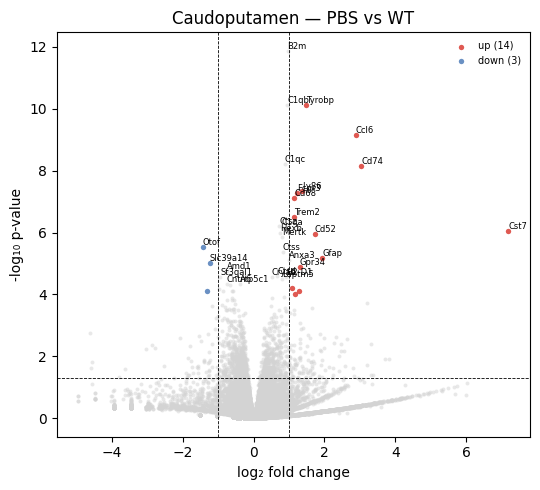

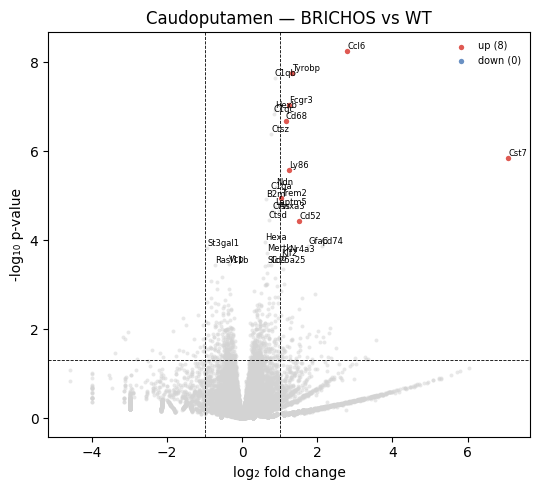

Corpus callosum


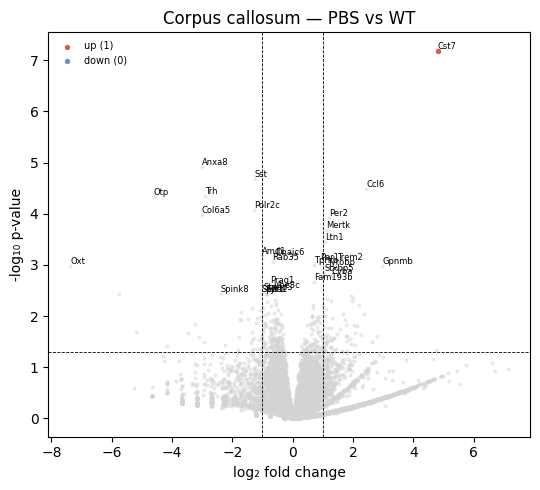

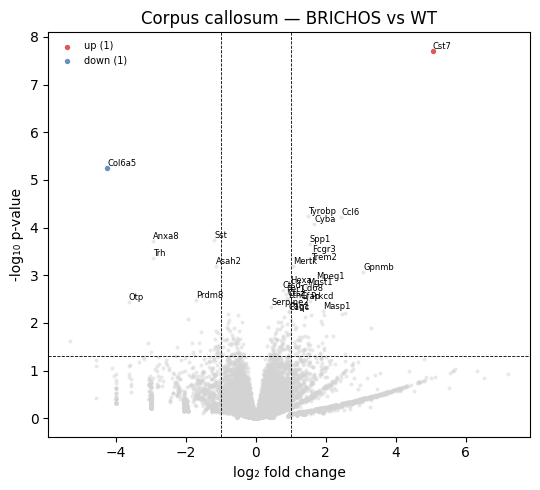

Hippocampal formation


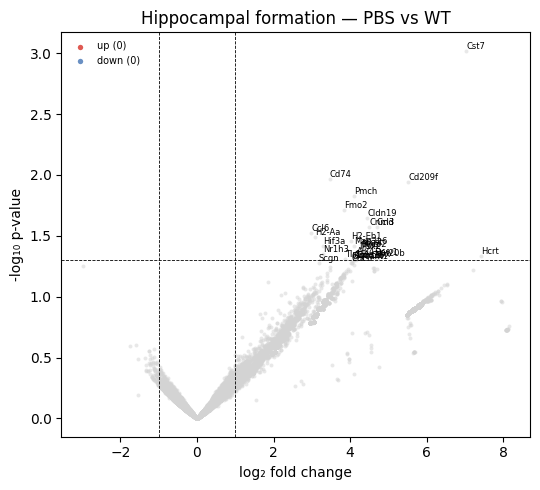

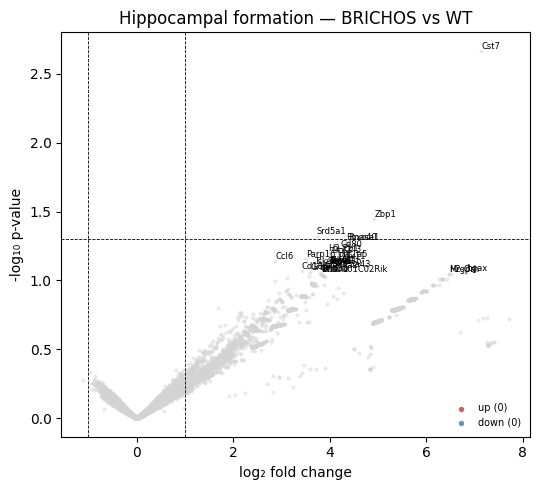

Hypothalamus


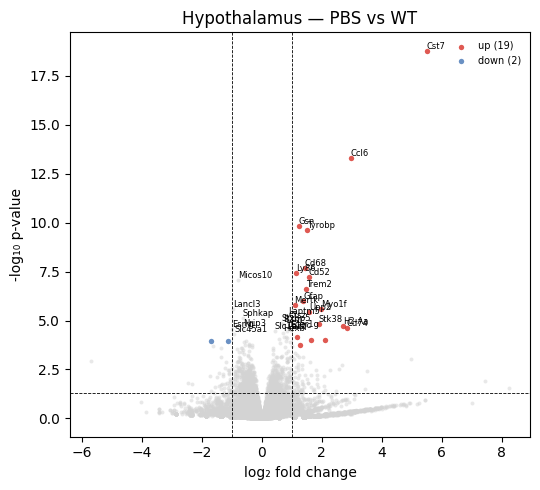

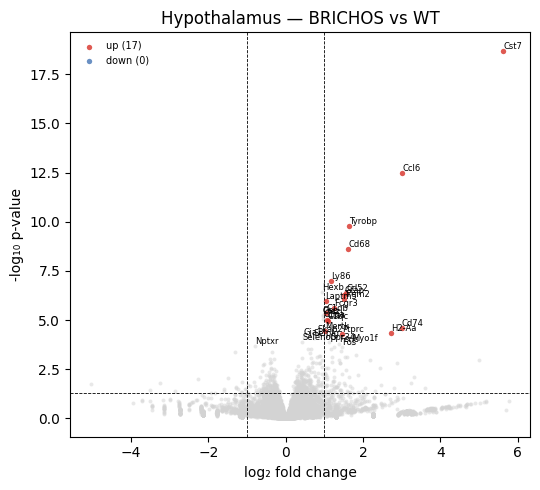

Infragranular layers


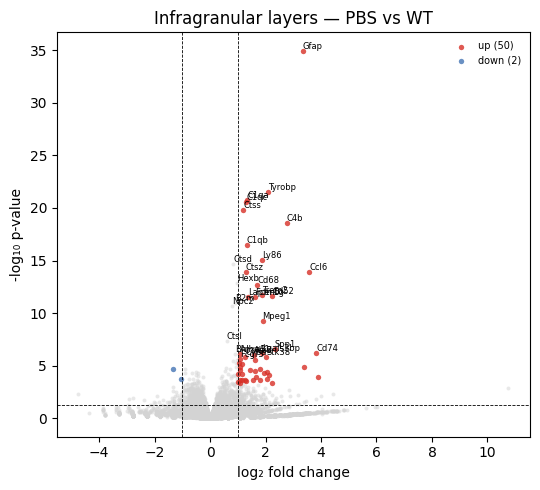

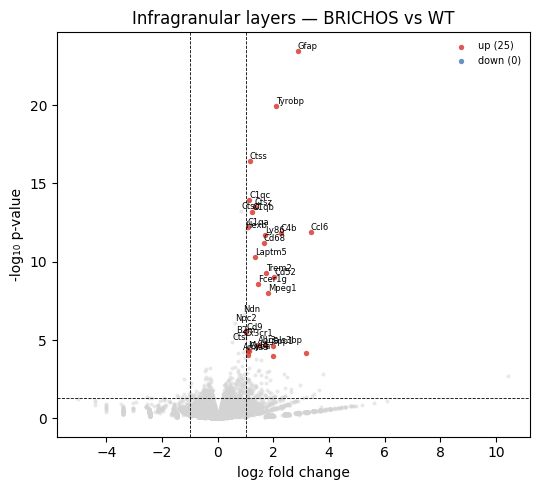

Meninges


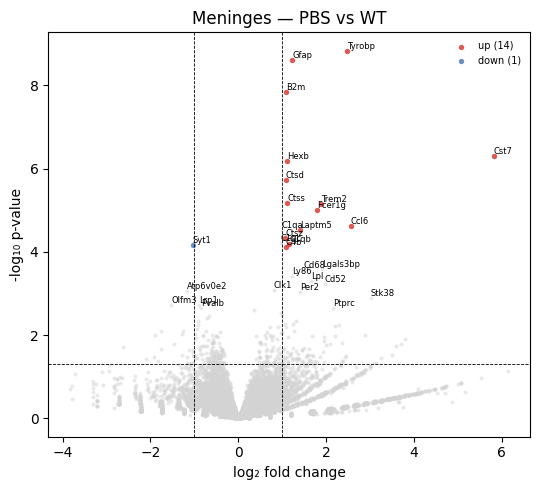

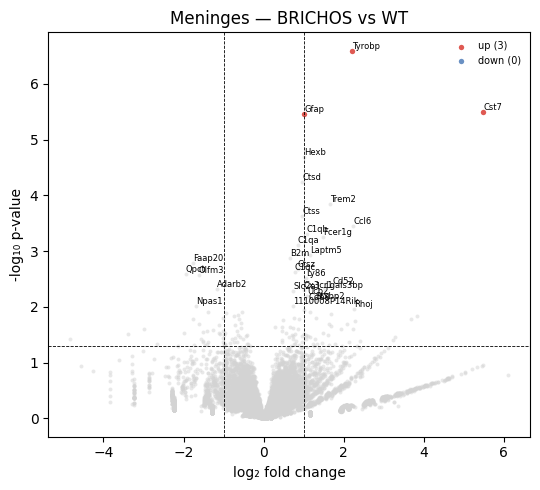

Olfactory areas


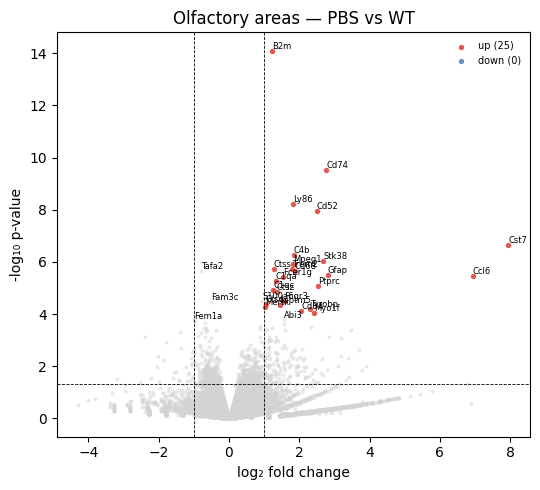

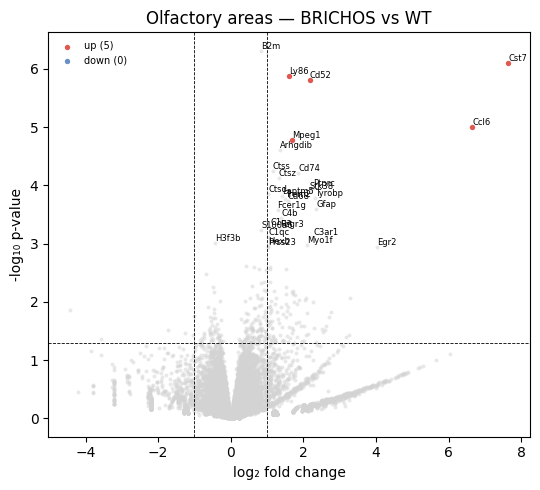

Supragranualar layers


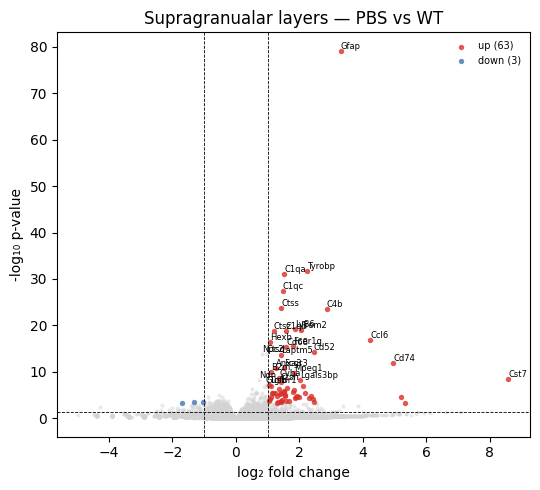

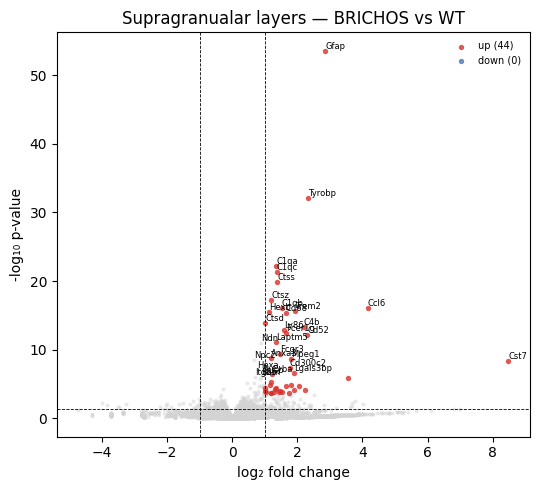

Thalamus


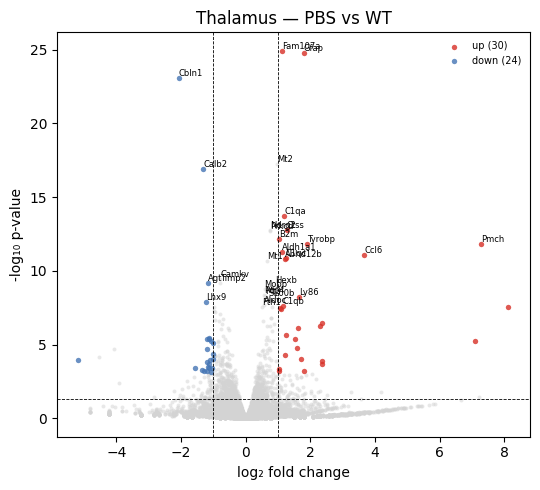

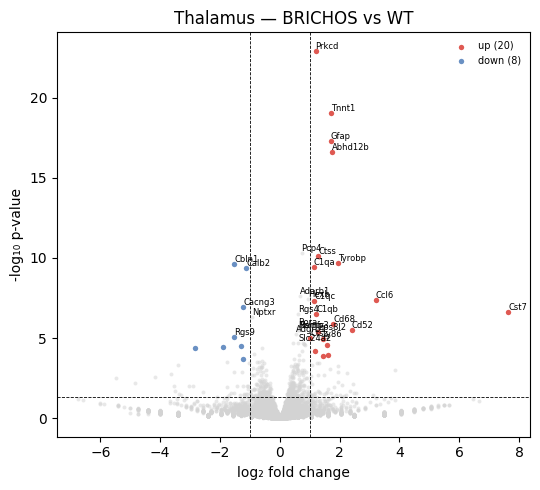

Ventricular area


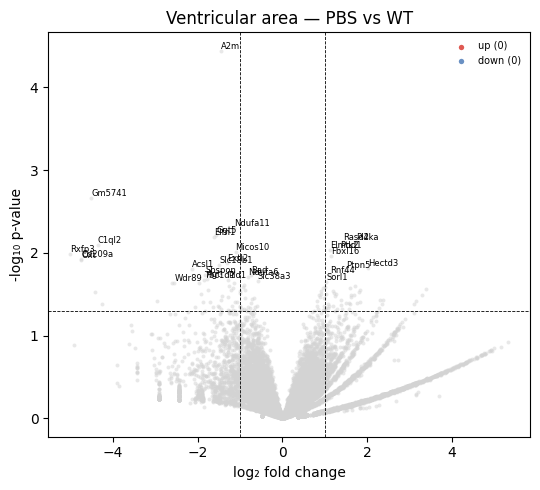

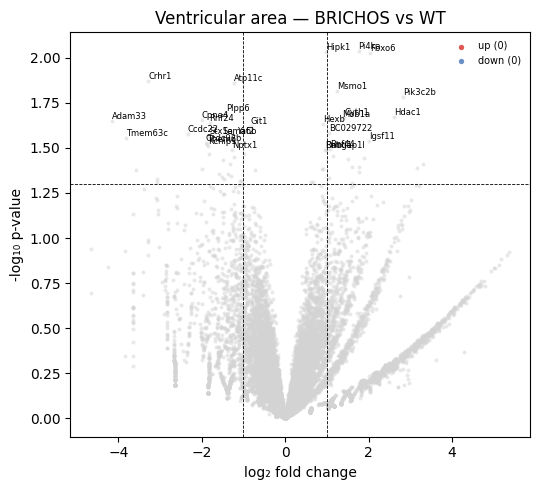

In [31]:
for comp in dge_by_comp.keys():
    print(comp)
    contrast = "PBS_vs_WT"
    if comp in dge_by_comp and contrast in dge_by_comp[comp]:
        volcano_from_res(
            dge_by_comp[comp][contrast],
            title=f"{comp} — {contrast.replace('_', ' ')}"
        )
    else:
        print("that compartment/contrast wasn't available")
    contrast = "BRICHOS_vs_WT"
    if comp in dge_by_comp and contrast in dge_by_comp[comp]:
        volcano_from_res(
            dge_by_comp[comp][contrast],
            title=f"{comp} — {contrast.replace('_', ' ')}"
        )
    else:
        print("that compartment/contrast wasn't available")

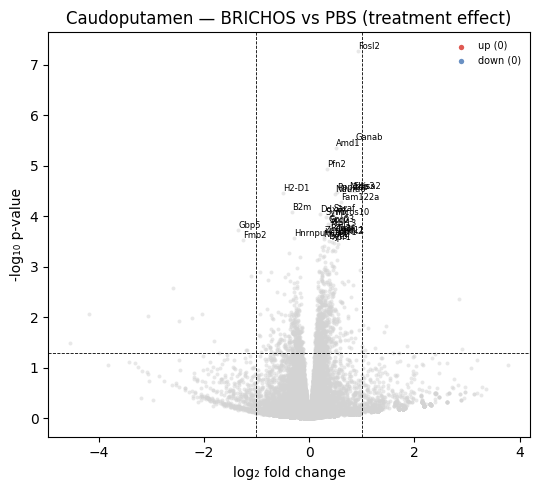

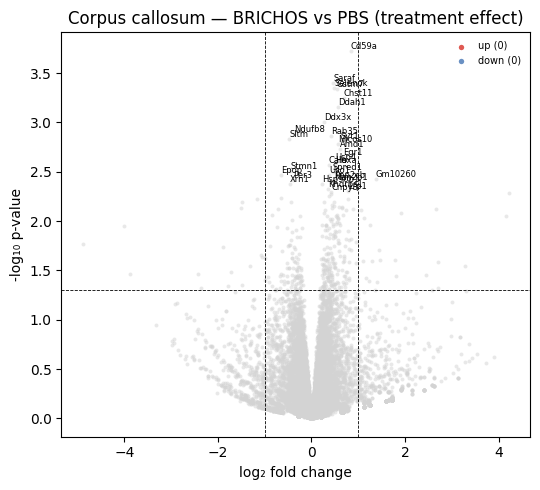

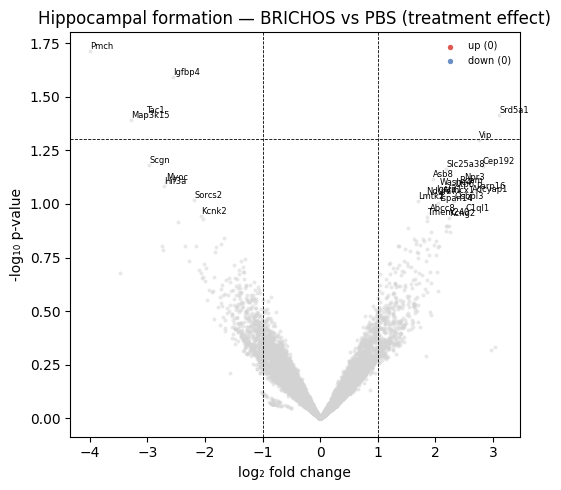

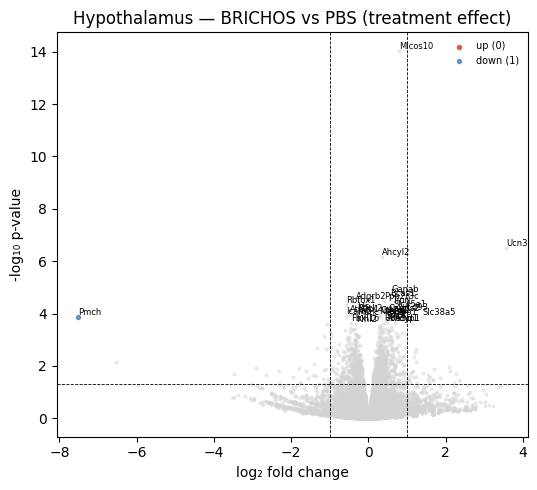

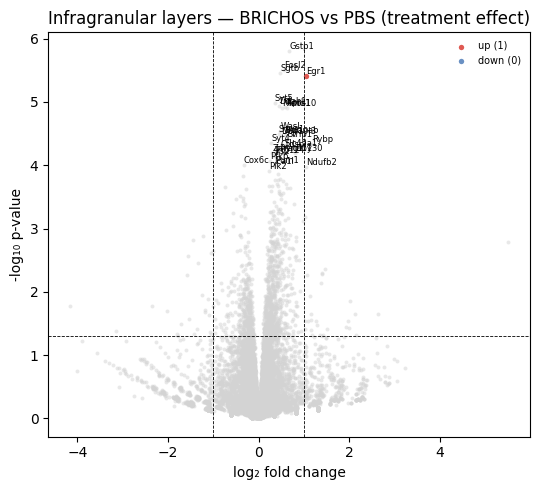

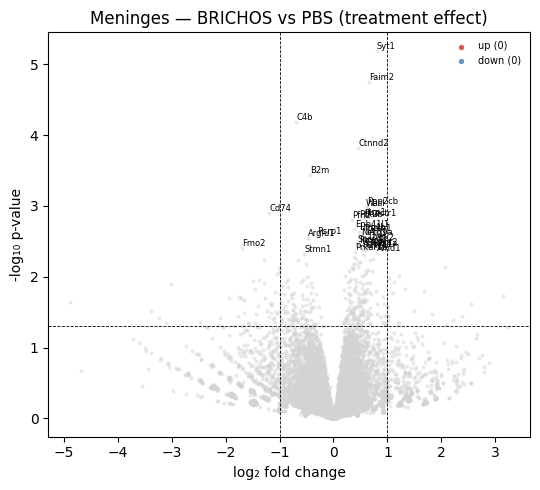

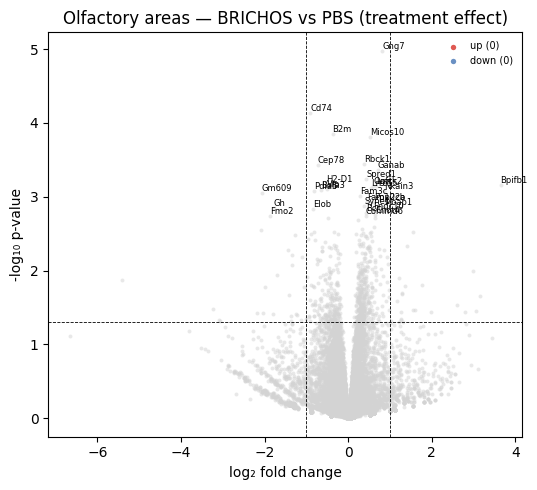

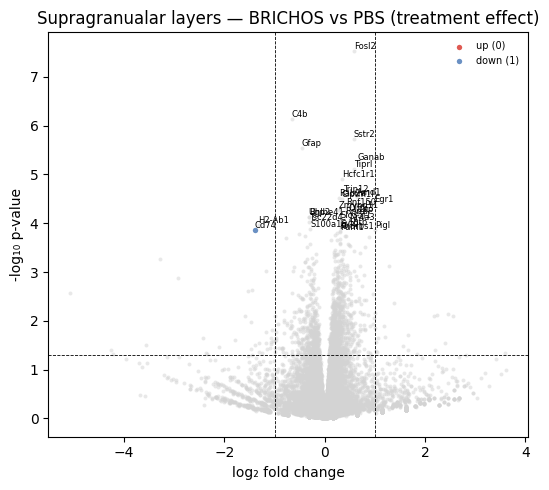

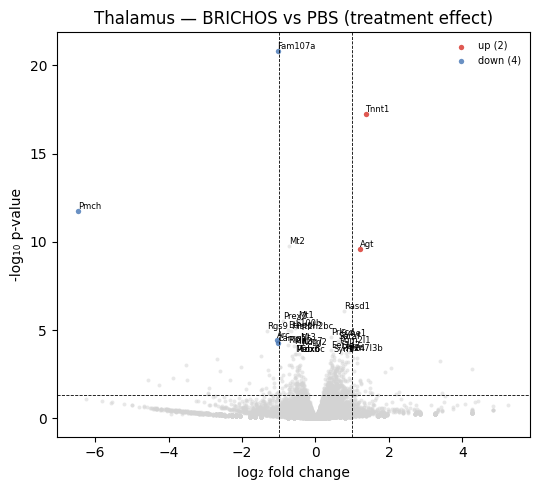

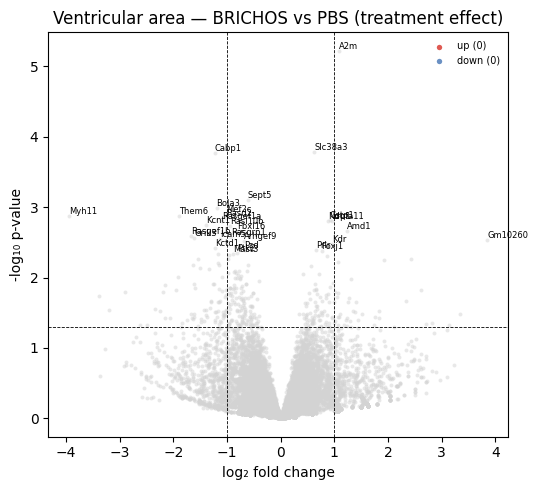

In [32]:
# --- BRICHOS vs PBS volcano plots per region ---
for comp in sorted(dge_by_comp.keys()):
    contrast = "BRICHOS_vs_PBS"
    if contrast in dge_by_comp[comp]:
        volcano_from_res(
            dge_by_comp[comp][contrast],
            title=f"{comp} — BRICHOS vs PBS (treatment effect)"
        )
    else:
        print(f"{comp}: {contrast} not available")


In [33]:
# --- Save BRICHOS vs PBS DE results per region ---
import os
os.makedirs("../results/tables", exist_ok=True)

for comp, contrasts in dge_by_comp.items():
    if "BRICHOS_vs_PBS" in contrasts:
        res = contrasts["BRICHOS_vs_PBS"].copy()
        res = res.sort_values("pvalue")
        fname = comp.replace(" ", "_").replace("/", "_")
        res.to_csv(f"../results/tables/DGE_BRICHOS_vs_PBS_{fname}.csv")
        n_sig = (res["padj"] < 0.05).sum()
        print(f"{comp}: {n_sig} DE genes (padj < 0.05)")

print("\nAll regional BRICHOS vs PBS DE tables saved to results/tables/")


Caudoputamen: 21 DE genes (padj < 0.05)
Corpus callosum: 0 DE genes (padj < 0.05)
Hippocampal formation: 0 DE genes (padj < 0.05)
Hypothalamus: 38 DE genes (padj < 0.05)
Infragranular layers: 43 DE genes (padj < 0.05)
Meninges: 0 DE genes (padj < 0.05)
Olfactory areas: 0 DE genes (padj < 0.05)
Supragranualar layers: 40 DE genes (padj < 0.05)
Thalamus: 32 DE genes (padj < 0.05)
Ventricular area: 0 DE genes (padj < 0.05)

All regional BRICHOS vs PBS DE tables saved to results/tables/


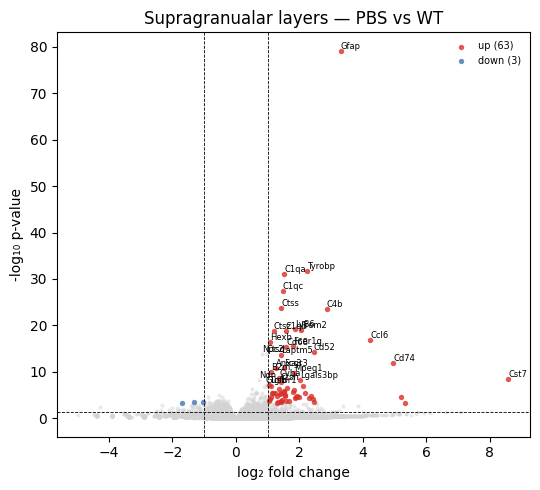

In [34]:
# example: hippocampus, BRICHOS vs PBS
comp = "Supragranualar layers"
contrast = "PBS_vs_WT"

if comp in dge_by_comp and contrast in dge_by_comp[comp]:
    volcano_from_res(
        dge_by_comp[comp][contrast],
        title=f"{comp} — {contrast.replace('_', ' ')}"
    )
else:
    print("that compartment/contrast wasn't available")

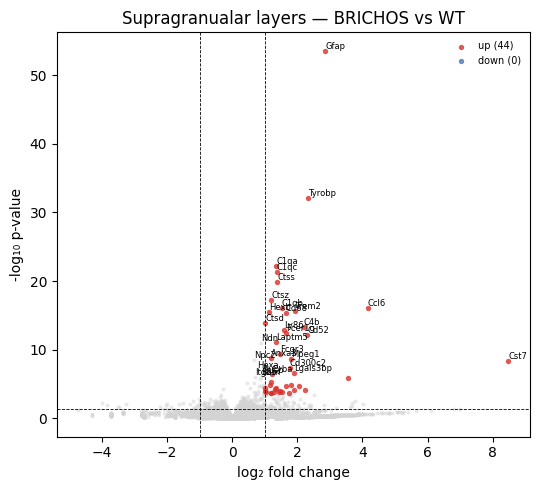

In [35]:
# example: hippocampus, BRICHOS vs PBS
comp = "Supragranualar layers"
contrast = "BRICHOS_vs_WT"

if comp in dge_by_comp and contrast in dge_by_comp[comp]:
    volcano_from_res(
        dge_by_comp[comp][contrast],
        title=f"{comp} — {contrast.replace('_', ' ')}"
    )
else:
    print("that compartment/contrast wasn't available")

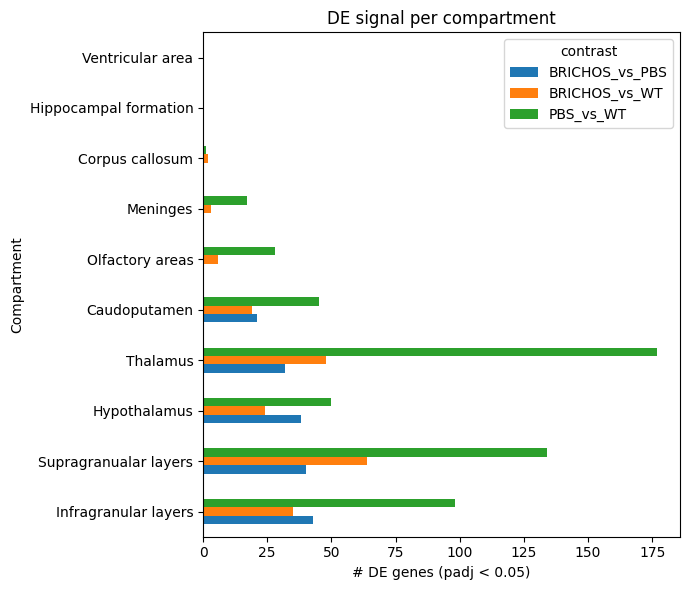

In [36]:
import matplotlib.pyplot as plt

records = []
for comp, d in dge_by_comp.items():
    for contrast, df in d.items():
        # clean
        dfc = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["padj"])
        n_de = (dfc["padj"] < 0.05).sum()
        records.append({
            "compartment": comp,
            "contrast": contrast,
            "n_DE": n_de,
        })

summary = pd.DataFrame(records)

# pivot for plotting
pivot = summary.pivot(index="compartment", columns="contrast", values="n_DE").fillna(0)
pivot = pivot.sort_values(by=pivot.columns.tolist(), ascending=False)

fig, ax = plt.subplots(figsize=(7, 4 + 0.2*len(pivot)))
pivot.plot(kind="barh", ax=ax)
ax.set_xlabel("# DE genes (padj < 0.05)")
ax.set_ylabel("Compartment")
ax.set_title("DE signal per compartment")
plt.tight_layout()
plt.show()

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# assume you already have:
# dge_by_comp = {"Thalamus": {"BRICHOS_vs_PBS": res_df, ...}, ...}
# pig_genes = [...]   # your 57 plaque-induced genes

pig_res_summary = []

for region, contrasts in dge_by_comp.items():
    if "BRICHOS_vs_PBS" not in contrasts:
        continue
    res = contrasts["BRICHOS_vs_PBS"].copy()
    res = res.replace([np.inf, -np.inf], np.nan)
    res = res.loc[res.index.intersection(pig_genes)]

    if res.empty:
        continue

    # summary stats
    n_sig = (res["padj"] < 0.05).sum()
    mean_lfc = res["log2FoldChange"].mean()
    pig_res_summary.append({
        "region": region,
        "n_PIGs": res.shape[0],
        "n_sig_PIGs": n_sig,
        "mean_log2FC": mean_lfc,
        "mean_neglog10p": -np.log10(res["pvalue"] + 1e-300).mean(),
    })

pig_summary_df = pd.DataFrame(pig_res_summary).set_index("region").sort_values("mean_log2FC")

display(pig_summary_df.style.background_gradient(cmap="coolwarm", subset=["mean_log2FC"]))

,n_PIGs,n_sig_PIGs,mean_log2FC,mean_neglog10p
region,,,,
Meninges,53,0,-0.321836,0.684490
Olfactory areas,53,0,-0.264944,0.630743
Infragranular layers,53,0,-0.212344,0.801181
Thalamus,53,1,-0.188869,0.367048
Supragranualar layers,53,1,-0.172476,0.907318
Hippocampal formation,53,0,-0.136023,0.120534
Caudoputamen,53,1,-0.077491,0.657909
Hypothalamus,53,0,0.058795,0.524492
Ventricular area,53,0,0.064371,0.325965


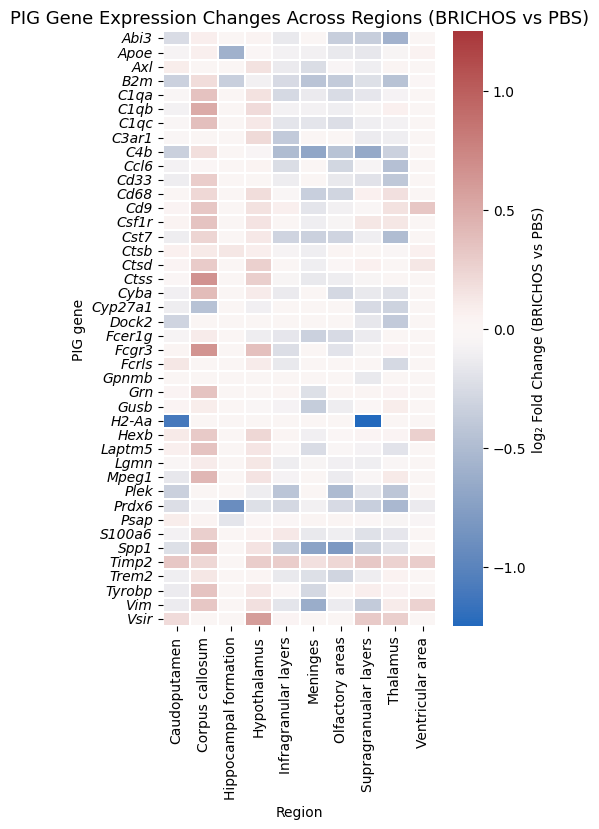

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Collect PIG fold changes per region ---
pig_fc_matrix = {}

for region, contrasts in dge_by_comp.items():
    if "BRICHOS_vs_PBS" not in contrasts:
        continue
    res = contrasts["BRICHOS_vs_PBS"].copy()
    res = res[res.baseMean > 50]
    # res = res[res.padj < 0.1]  # optional filter for significance
    res = res.loc[res.index.intersection(pig_genes)]
    pig_fc_matrix[region] = res["log2FoldChange"]

# --- Assemble matrix (genes × regions) ---
pig_fc_df = pd.DataFrame(pig_fc_matrix).fillna(0)

# --- Symmetric color scale ---
vmax = 1.25
vmin = -vmax

# --- Plot heatmap ---
plt.figure(figsize=(5, max(4, len(pig_fc_df) * 0.2)))
ax = sns.heatmap(
    pig_fc_df,
    cmap=sns.color_palette("vlag", as_cmap=True),
    center=0,
    vmin=vmin,
    vmax=vmax,
    cbar_kws={"label": "log₂ Fold Change (BRICHOS vs PBS)"},
    linewidths=0.3,
)

# Italicize y-axis gene labels
for label in ax.get_yticklabels():
    label.set_fontstyle("italic")

plt.title("PIG Gene Expression Changes Across Regions (BRICHOS vs PBS)", fontsize=13)
plt.xlabel("Region")
plt.ylabel("PIG gene")
plt.tight_layout()
plt.show()

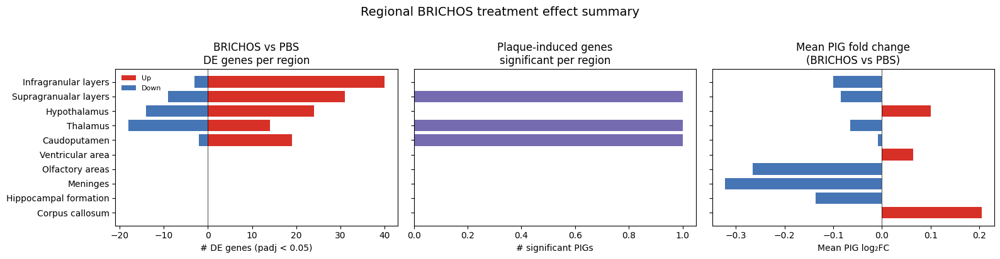

,n_DE_total,n_DE_up,n_DE_down,n_PIG_sig,mean_PIG_lfc
region,,,,,
Corpus callosum,0,0,0,0,0.204145
Hippocampal formation,0,0,0,0,-0.136023
Meninges,0,0,0,0,-0.321836
Olfactory areas,0,0,0,0,-0.264944
Ventricular area,0,0,0,0,0.064371
Caudoputamen,21,19,2,1,-0.008590
Thalamus,32,14,18,1,-0.064766
Hypothalamus,38,24,14,0,0.099489
Supragranualar layers,40,31,9,1,-0.084704


In [39]:
# --- Regional BRICHOS vs PBS effect summary ---
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

records = []
for comp, contrasts in dge_by_comp.items():
    if "BRICHOS_vs_PBS" not in contrasts:
        continue
    res = contrasts["BRICHOS_vs_PBS"].copy()
    res = res.replace([np.inf, -np.inf], np.nan).dropna(subset=["padj"])
    sig = res[res["padj"] < 0.05]
    
    # PIG overlap
    pig_in_res = res.loc[res.index.intersection(pig_genes)]
    pig_sig = pig_in_res[pig_in_res["padj"] < 0.05] if not pig_in_res.empty else pig_in_res
    
    records.append({
        "region": comp,
        "n_DE_total": (res["padj"] < 0.05).sum(),
        "n_DE_up": ((sig["log2FoldChange"] > 0)).sum(),
        "n_DE_down": ((sig["log2FoldChange"] < 0)).sum(),
        "n_PIG_sig": len(pig_sig),
        "mean_PIG_lfc": pig_in_res["log2FoldChange"].mean() if not pig_in_res.empty else np.nan,
    })

summary_df = pd.DataFrame(records).set_index("region").sort_values("n_DE_total", ascending=True)

fig, axes = plt.subplots(1, 3, figsize=(16, max(4, len(summary_df) * 0.4)), sharey=True)

# Panel 1: total DE genes
axes[0].barh(summary_df.index, summary_df["n_DE_up"], color="#d73027", label="Up")
axes[0].barh(summary_df.index, -summary_df["n_DE_down"], color="#4575b4", label="Down")
axes[0].set_xlabel("# DE genes (padj < 0.05)")
axes[0].set_title("BRICHOS vs PBS\nDE genes per region")
axes[0].legend(frameon=False, fontsize=8)
axes[0].axvline(0, color="k", lw=0.5)

# Panel 2: PIG genes significant
axes[1].barh(summary_df.index, summary_df["n_PIG_sig"], color="#756bb1")
axes[1].set_xlabel("# significant PIGs")
axes[1].set_title("Plaque-induced genes\nsignificant per region")

# Panel 3: mean PIG log2FC
colors = ["#d73027" if v > 0 else "#4575b4" for v in summary_df["mean_PIG_lfc"].fillna(0)]
axes[2].barh(summary_df.index, summary_df["mean_PIG_lfc"], color=colors)
axes[2].set_xlabel("Mean PIG log₂FC")
axes[2].set_title("Mean PIG fold change\n(BRICHOS vs PBS)")
axes[2].axvline(0, color="k", lw=0.5)

plt.suptitle("Regional BRICHOS treatment effect summary", fontsize=14, y=1.02)
plt.tight_layout()

fig.savefig("../results/figures/regional_BRICHOS_vs_PBS_summary.pdf", bbox_inches="tight")
fig.savefig("../results/figures/regional_BRICHOS_vs_PBS_summary.png", dpi=300, bbox_inches="tight")
plt.show()

display(summary_df)



===== Caudoputamen =====


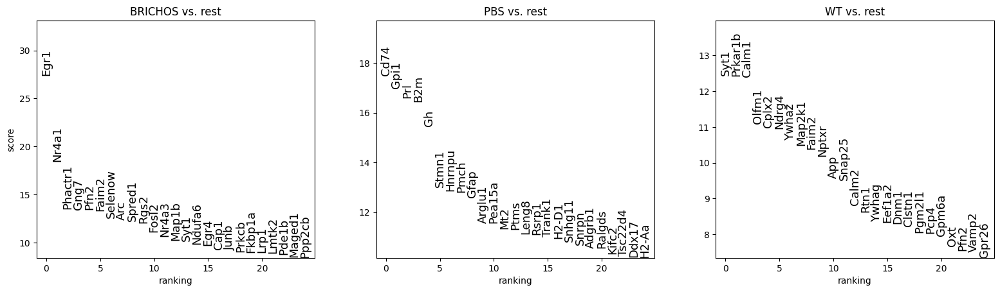

Top markers by treatment in Caudoputamen:
  BRICHOS: Egr1 Nr4a1 Phactr1 Gng7 Pfn2
  PBS: Cd74 Gpi1 Prl B2m Gh
  WT: Syt1 Prkar1b Calm1 Olfm1 Cplx2


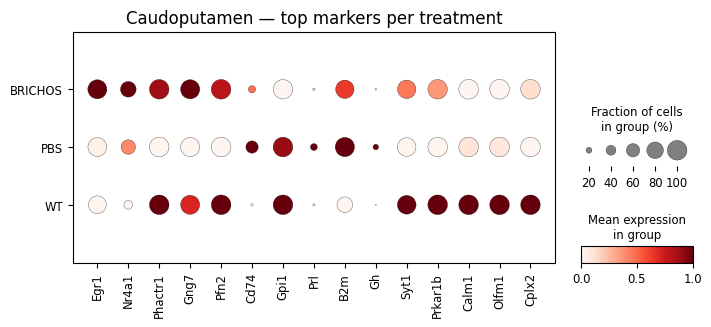


===== Corpus callosum =====


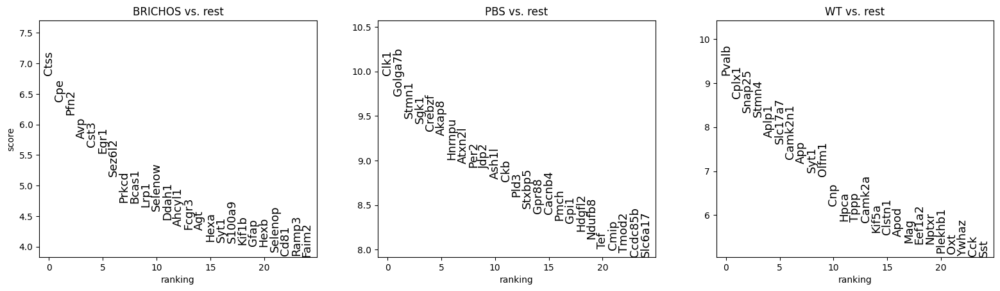

Top markers by treatment in Corpus callosum:
  BRICHOS: Ctss Cpe Pfn2 Avp Cst3
  PBS: Clk1 Golga7b Stmn1 Sgk1 Crebzf
  WT: Pvalb Cplx1 Snap25 Stmn4 Aplp1


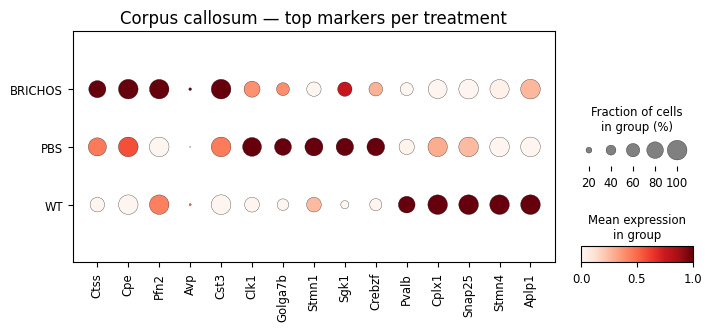


===== Hippocampal formation =====


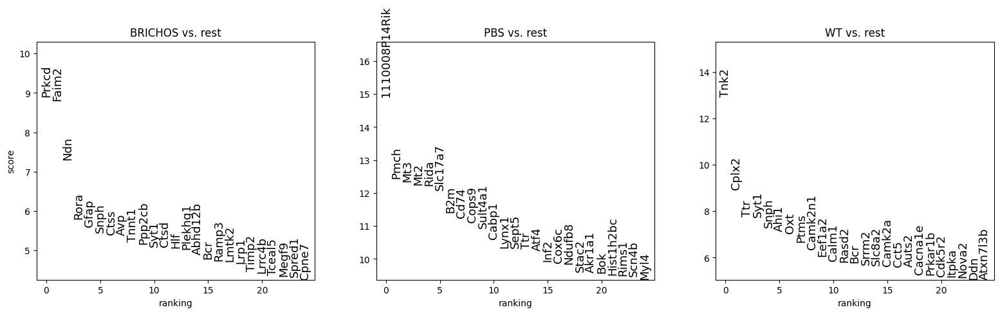

Top markers by treatment in Hippocampal formation:
  BRICHOS: Prkcd Faim2 Ndn Rora Gfap
  PBS: 1110008P14Rik Pmch Mt3 Mt2 Rida
  WT: Tnk2 Cplx2 Ttr Syt1 Snph


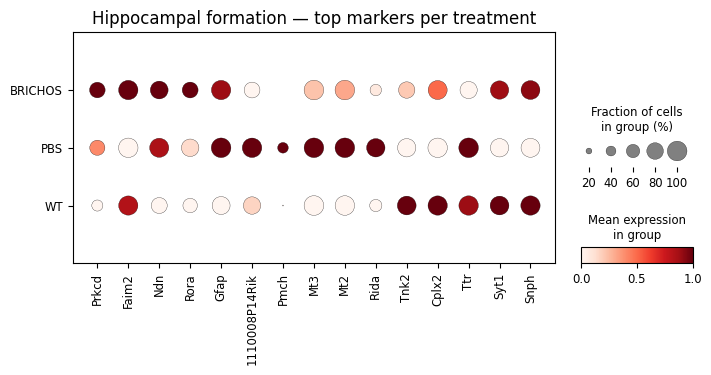


===== Hypothalamus =====


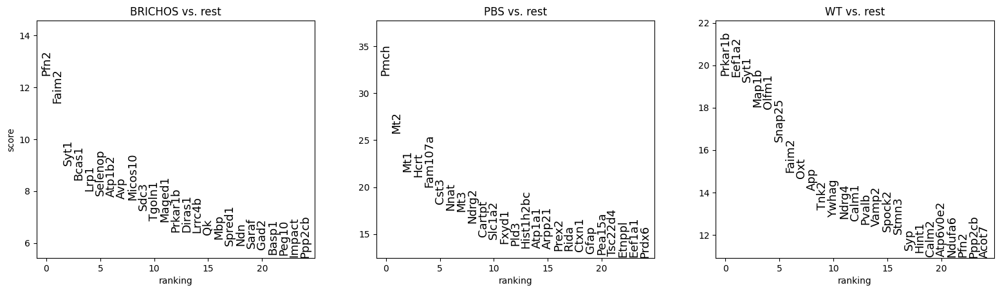

Top markers by treatment in Hypothalamus:
  BRICHOS: Pfn2 Faim2 Syt1 Bcas1 Lrp1
  PBS: Pmch Mt2 Mt1 Hcrt Fam107a
  WT: Prkar1b Eef1a2 Syt1 Map1b Olfm1


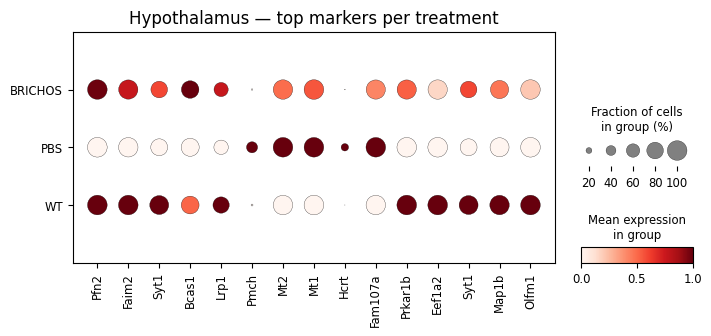


===== Infragranular layers =====


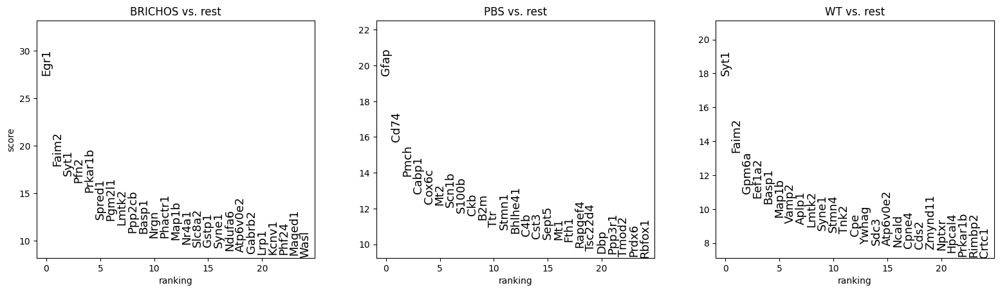

Top markers by treatment in Infragranular layers:
  BRICHOS: Egr1 Faim2 Syt1 Pfn2 Prkar1b
  PBS: Gfap Cd74 Pmch Cabp1 Cox6c
  WT: Syt1 Faim2 Gpm6a Eef1a2 Basp1


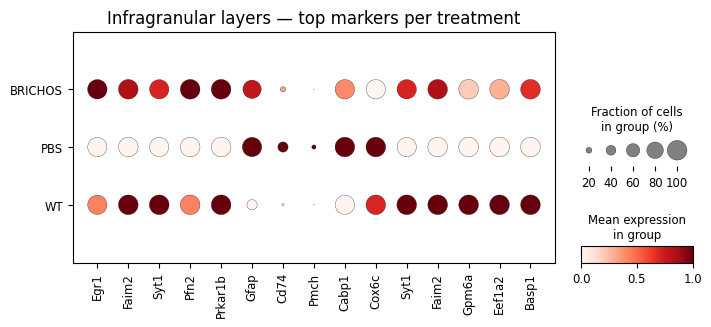


===== Meninges =====


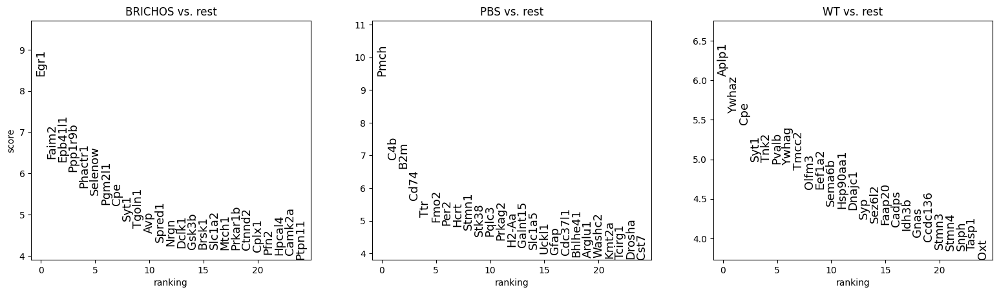

Top markers by treatment in Meninges:
  BRICHOS: Egr1 Faim2 Epb41l1 Ppp1r9b Phactr1
  PBS: Pmch C4b B2m Cd74 Ttr
  WT: Aplp1 Ywhaz Cpe Syt1 Tnk2


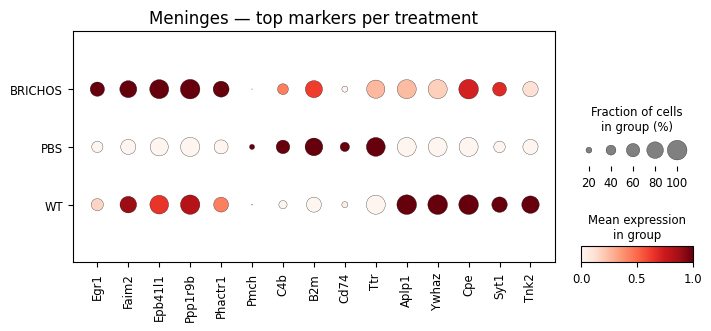


===== Olfactory areas =====


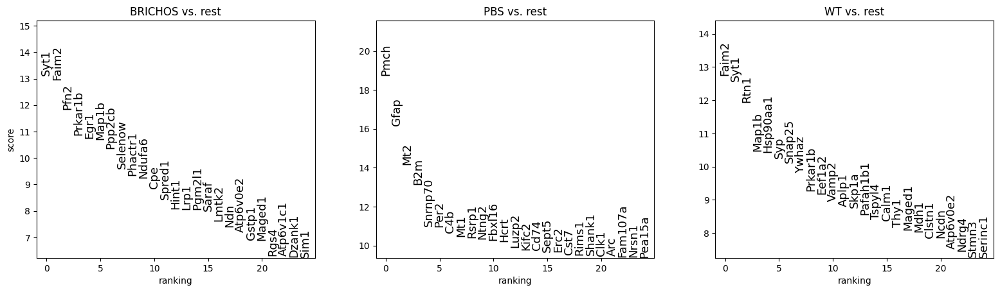

Top markers by treatment in Olfactory areas:
  BRICHOS: Syt1 Faim2 Pfn2 Prkar1b Egr1
  PBS: Pmch Gfap Mt2 B2m Snrnp70
  WT: Faim2 Syt1 Rtn1 Map1b Hsp90aa1


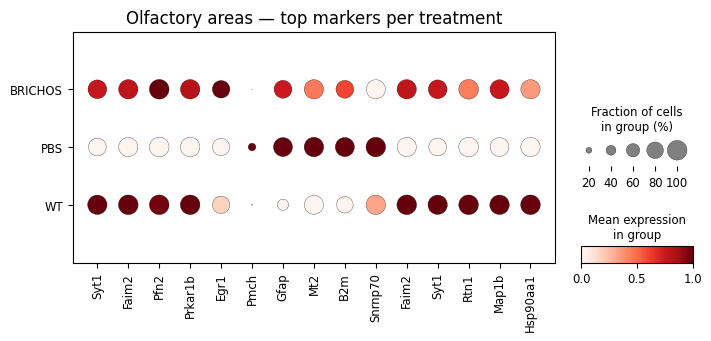


===== Supragranualar layers =====


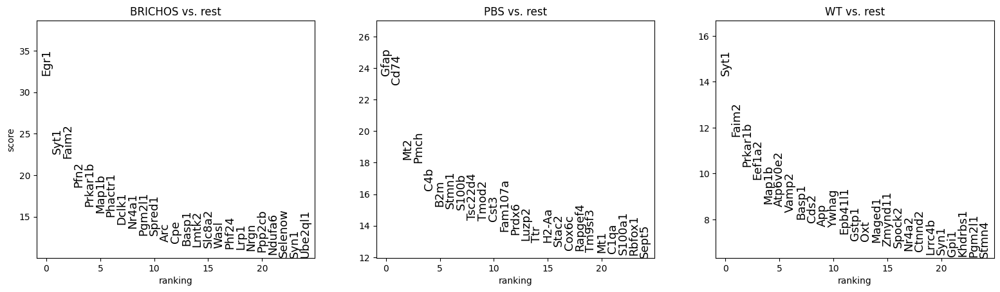

Top markers by treatment in Supragranualar layers:
  BRICHOS: Egr1 Syt1 Faim2 Pfn2 Prkar1b
  PBS: Gfap Cd74 Mt2 Pmch C4b
  WT: Syt1 Faim2 Prkar1b Eef1a2 Map1b


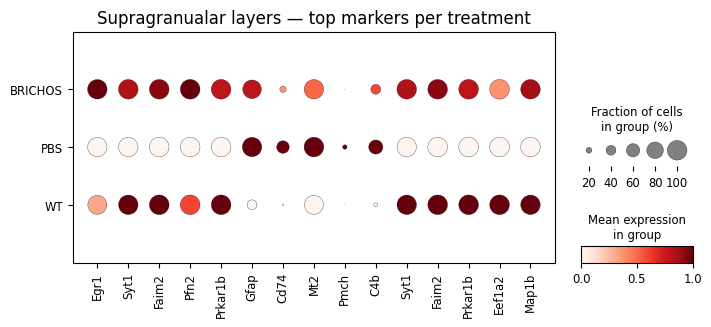


===== Thalamus =====


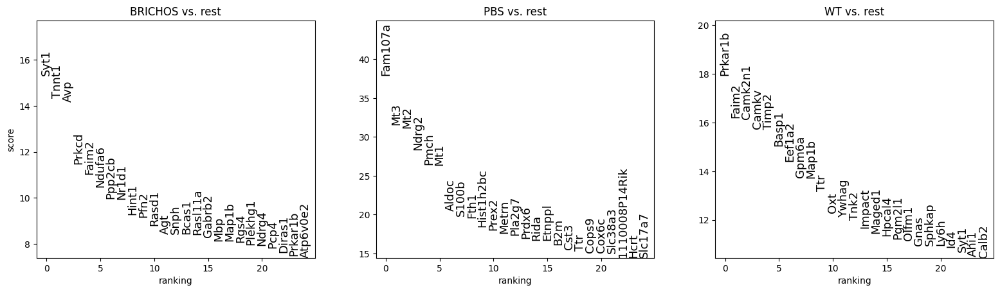

Top markers by treatment in Thalamus:
  BRICHOS: Syt1 Tnnt1 Avp Prkcd Faim2
  PBS: Fam107a Mt3 Mt2 Ndrg2 Pmch
  WT: Prkar1b Faim2 Camk2n1 Camkv Timp2


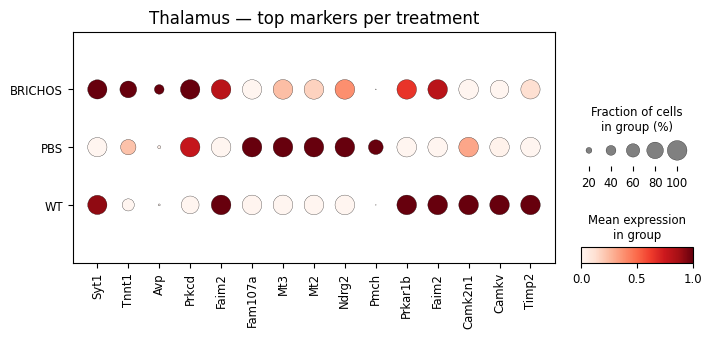


===== Ventricular area =====


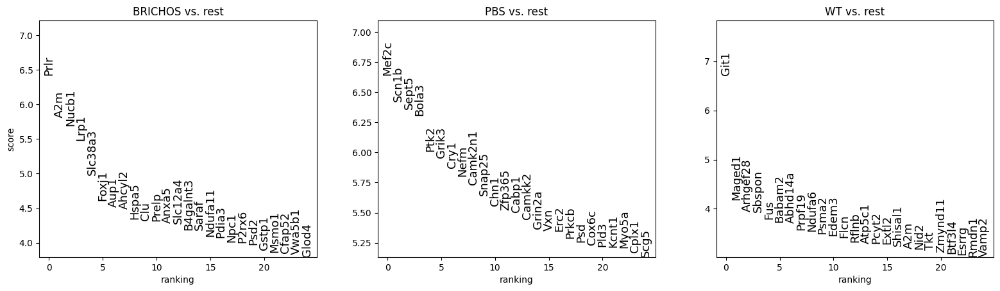

Top markers by treatment in Ventricular area:
  BRICHOS: Prlr A2m Nucb1 Lrp1 Slc38a3
  PBS: Mef2c Scn1b Sept5 Bola3 Ptk2
  WT: Git1 Maged1 Arhgef28 Sbspon Fus


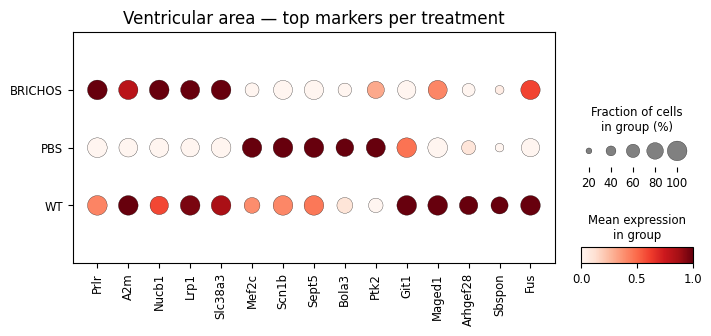

In [40]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# --- Loop through regions ---
region_marker_dict = {}  # store results by region

for region, contrasts in dge_by_comp.items():
    print(f"\n===== {region} =====")
    adata_reg = adata[adata.obs['re_annotation_regions'] == region]
    
    # --- Find marker genes per treatment ---
    sc.tl.rank_genes_groups(adata_reg, groupby="treatment", method="t-test")
    sc.pl.rank_genes_groups(adata_reg, n_genes=25, sharey=False, fontsize=13)
    
    # --- Extract top marker genes ---
    markers = sc.get.rank_genes_groups_df(adata_reg, group=None)
    marker_genes = {
        group: adata_reg.uns['rank_genes_groups']['names'][group][:5].tolist()
        for group in adata_reg.uns['rank_genes_groups']['names'].dtype.names
    }

    # Store in dictionary
    region_marker_dict[region] = marker_genes

    # --- Flatten all gene lists for plotting ---
    combined_list = [g for genes in marker_genes.values() for g in genes]
    print(f"Top markers by treatment in {region}:")
    for k, v in marker_genes.items():
        print(f"  {k}: {' '.join(v)}")
    
    # --- Dotplot visualization ---
    sc.pl.dotplot(
        adata_reg,
        var_names=combined_list,
        groupby="treatment",
        standard_scale="var",
        color_map="Reds",
        figsize=(8, 3),
        title=f"{region} — top markers per treatment",
    )

# optional: save the dictionary
# pd.DataFrame(region_marker_dict).to_json("../results/region_markers.json")

In [41]:
contrasts

{'PBS_vs_WT':                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
 Xkr4            1.209901        2.713026  3.649825  0.743330  0.457282   
 Rp1             1.132562        2.857892  3.670093  0.778697  0.436158   
 Sox17           2.609723        1.520824  1.718243  0.885104  0.376101   
 Lypla1         31.917165       -0.282734  0.436966 -0.647039  0.517606   
 Tcea1          35.511925       -0.205209  0.394178 -0.520600  0.602645   
 ...                  ...             ...       ...       ...       ...   
 Arhgap6         3.777857        0.137163  1.184931  0.115756  0.907846   
 Hccs           17.134788        0.030657  0.569226  0.053857  0.957049   
 Mid1            3.814977        0.860581  1.371028  0.627690  0.530207   
 4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
 Asmt            0.000000             NaN       NaN       NaN       NaN   
 
                    padj       compartment   contrast  
 Xkr4           0.999212  Ven

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_gene_across_regions(
    adata,
    gene,
    region_key="re_annotation_regions",
    treatment_key="treatment",
    sample_key="sample_id",
    palette=("#e3b505", "#0077b6", "#9b2226"),
    figsize=(10, 5),
    show_legend=True,
):
    """
    Plot mean expression (±SEM) and per-mouse dots across regions and treatments.

    Parameters
    ----------
    adata : AnnData
        Input spatial or single-cell dataset with obs containing sample, treatment, and region info.
    gene : str
        Gene name to plot.
    region_key : str, default="re_annotation_regions"
        Column name in adata.obs that defines brain regions.
    treatment_key : str, default="treatment"
        Column name in adata.obs that defines treatment group (e.g. PBS, BRICHOS, WT).
    sample_key : str, default="sample_id"
        Column name in adata.obs that identifies biological replicates / mice.
    palette : tuple
        Colors for treatments (must match number of treatment levels).
    figsize : tuple
        Size of the figure.
    show_legend : bool, default=True
        Whether to display the legend.
    """

    # --- Extract expression and metadata ---
    expr = adata.to_df()
    meta = adata.obs[[sample_key, treatment_key, region_key]]
    df = (
        expr.join(meta)
        .groupby([sample_key, treatment_key, region_key])
        .mean()
        .reset_index()
    )

    # --- Compute mean and SEM ---
    def safe_sem(x):
        x = np.asarray(x, float)
        return np.nan if len(x) < 2 else x.std(ddof=1) / np.sqrt(len(x))

    summary = (
        df.groupby([treatment_key, region_key])[gene]
        .agg(mean="mean", sem=safe_sem, n="count")
        .reset_index()
    )

    # --- Plot ---
    plt.figure(figsize=figsize)

    # Bars + error bars
    sns.barplot(
        data=summary,
        x=region_key,
        y="mean",
        hue=treatment_key,
        palette=palette,
        capsize=0.05,
        errwidth=1.2,
    )

    # Dots (individual mice)
    sns.stripplot(
        data=df,
        x=region_key,
        y=gene,
        hue=treatment_key,
        dodge=True,
        palette=palette,
        marker="o",
        edgecolor="black",
        linewidth=0.3,
        size=3.5,
        alpha=0.7,
    )

    # Clean legend
    handles, labels = plt.gca().get_legend_handles_labels()
    if show_legend:
        plt.legend(
            handles[: len(summary[treatment_key].unique())],
            labels[: len(summary[treatment_key].unique())],
            title="Treatment",
            frameon=False,
            bbox_to_anchor=(1.02, 1),
            loc="upper left",
        )
    else:
        plt.legend([], [], frameon=False)

    plt.xticks(rotation=45, ha="right")
    plt.ylabel(f"{gene} mean expression (per mouse)")
    plt.title(f"{gene} expression across regions and treatments\n(single WT mouse shown as single dot)")
    plt.tight_layout()
    plt.show()

    return summary

In [43]:
pig_genes

['Abi3',
 'Apoe',
 'Axl',
 'B2m',
 'C1qa',
 'C1qb',
 'C1qc',
 'C3ar1',
 'C4b',
 'Ccl6',
 'Cd33',
 'Cd68',
 'Cd9',
 'Csf1',
 'Csf1r',
 'Cst7',
 'Ctss',
 'Ctsb',
 'Ctsd',
 'Cyba',
 'Cyp27a1',
 'Dock2',
 'Fcgr1',
 'Fcgr2b',
 'Fcgr3',
 'Fcer1g',
 'Fcrls',
 'Gpnmb',
 'Grn',
 'Gusb',
 'Hexb',
 'H2-Ab1',
 'H2-Eb1',
 'H2-Aa',
 'Itgax',
 'Laptm5',
 'Lgmn',
 'Lyz2',
 'Mpeg1',
 'Msr1',
 'Pf4',
 'Plek',
 'Prdx6',
 'Psap',
 'S100a4',
 'S100a6',
 'S100a11',
 'Spp1',
 'Timp2',
 'Trem2',
 'Tyrobp',
 'Vim',
 'Vsir']

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_multiple_genes_across_regions(
    adata,
    genes,
    region_key="re_annotation_regions",
    treatment_key="treatment",
    sample_key="sample_id",
    palette=("#e3b505", "#0077b6", "#9b2226"),
    save_base=None,      # e.g. "results/BBB_markers"
    figsize=(10, 4),
):
    """
    Plot mean expression (±SEM) and per-mouse dots across regions and treatments
    for several genes (one subplot per gene).

    Parameters
    ----------
    adata : AnnData
        Spatial/single-cell dataset with obs containing sample, treatment, and region.
    genes : list of str
        Gene symbols (e.g. ["Cldn5","Ocln","F11r","Tjp1"]).
    region_key : str
        Column in adata.obs with region annotation.
    treatment_key : str
        Column in adata.obs with treatment (e.g. PBS, BRICHOS, WT).
    sample_key : str
        Column in adata.obs identifying biological replicates.
    palette : tuple
        Colors for treatments.
    save_base : str or None
        If given, saves figures as PNG and summary CSV (e.g. "results/BBB_markers").
    figsize : tuple
        Figure size for each subplot.
    """

    # --- Extract data ---
    expr = adata.to_df()
    meta = adata.obs[[sample_key, treatment_key, region_key]]
    df = (
        expr.join(meta)
        .groupby([sample_key, treatment_key, region_key])
        .mean()
        .reset_index()
    )

    def safe_sem(x):
        x = np.asarray(x, float)
        return np.nan if len(x) < 2 else x.std(ddof=1) / np.sqrt(len(x))

    summaries = []

    n_genes = len(genes)
    ncols = 2
    nrows = int(np.ceil(n_genes / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=((figsize[0]*ncols)*0.5, figsize[1]*nrows))
    axes = np.ravel(axes)

    for ax, gene in zip(axes, genes):
        # --- Summary per region/treatment ---
        summary = (
            df.groupby([treatment_key, region_key])[gene]
            .agg(mean="mean", sem=safe_sem, n="count")
            .reset_index()
        )
        summary["gene"] = gene
        summaries.append(summary)

        # --- Plot ---
        sns.barplot(
            data=summary,
            x=region_key,
            y="mean",
            hue=treatment_key,
            palette=palette,
            capsize=0.05,
            errwidth=1.2,
            ax=ax,
        )
        sns.stripplot(
            data=df,
            x=region_key,
            y=gene,
            hue=treatment_key,
            dodge=True,
            palette=palette,
            marker="o",
            edgecolor="black",
            linewidth=0.3,
            size=3.0,
            alpha=0.7,
            ax=ax,
        )

        ax.set_title(gene, fontsize=12, style="italic")
        ax.set_xlabel("")
        ax.set_ylabel("Mean expression (per mouse)")
        ax.tick_params(axis="x", rotation=90)
        ax.legend_.remove()

    # unified legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles[: len(palette)], labels[: len(palette)], title="Treatment",
               frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.suptitle("Tight junction / BBB integrity markers across brain regions", y=1.02)
    plt.tight_layout()

    if save_base:
        fig.savefig(f"{save_base}.png", dpi=300, bbox_inches="tight")
        fig.savefig(f"{save_base}.pdf", bbox_inches="tight")

    summary_all = pd.concat(summaries, ignore_index=True)
    if save_base:
        summary_all.to_csv(f"{save_base}_summary.csv", index=False)

    plt.show()
    return summary_all

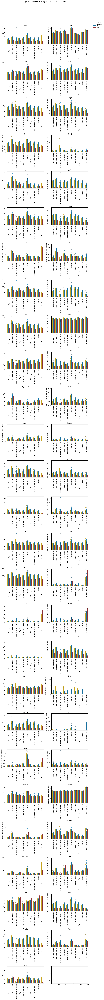

In [45]:

summary_bbb = plot_multiple_genes_across_regions(
    adata,
    genes=pig_genes,
   # save_base="results/BBB_markers"
)

## Region × Treatment Interaction Model

Test which genes have **region-specific** BRICHOS treatment responses using DESeq2 with interaction term: `~treatment + region + treatment:region`

In [46]:
# --- Region × Treatment interaction model ---
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats
import numpy as np, pandas as pd
from anndata import AnnData

# Use existing pseudobulk (mouse × region)
# Filter to PBS + BRICHOS only (treatment effect)
mask_trt = meta_df["treatment"].isin(["PBS", "BRICHOS"])
meta_int = meta_df.loc[mask_trt].copy()
cts_int = counts_df[meta_int.index]

# Build AnnData
ad_int = AnnData(X=cts_int.T.values)
ad_int.var_names = cts_int.index
ad_int.obs_names = cts_int.columns
ad_int.obs = meta_int.copy()

# Encode factors
ad_int.obs["treatment"] = pd.Categorical(
    ad_int.obs["treatment"], categories=["PBS", "BRICHOS"], ordered=True
)
ad_int.obs["region"] = ad_int.obs["re_annotation_regions"].astype(str)

# Fit model with interaction
inference = DefaultInference(n_cpus=8)
dds_int = DeseqDataSet(
    adata=ad_int,
    design_factors=["treatment", "region"],
    refit_cooks=True,
    inference=inference,
)
dds_int.deseq2()

print("Model fitted. Result names:")
print(dds_int.varm.keys())


Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 1.73 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 1.79 seconds.

Fitting LFCs...


Model fitted. Result names:
KeysView(AxisArrays with keys: LFC)


... done in 2.38 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 0 outlier genes.



In [47]:
# --- Extract interaction contrasts ---
# For each region, test: is BRICHOS effect different from baseline (reference region)?
# The interaction terms show region-specific deviations in treatment effect

# Get all coefficient names from the model
coef_names = list(dds_int.varm.keys())
print("Available coefficients:")
for c in coef_names:
    print(f"  {c}")

# Extract interaction coefficients (treatment × region terms)
interaction_coefs = [c for c in coef_names if "treatment" in c.lower() and "region" in c.lower()]
print(f"\nInteraction terms: {interaction_coefs}")


Available coefficients:
  LFC

Interaction terms: []


In [48]:
# --- Test interaction terms and identify region-specific responders ---
import warnings
warnings.filterwarnings('ignore')

interaction_results = {}

for coef in interaction_coefs:
    try:
        stat_res = DeseqStats(
            dds_int,
            contrast=[coef],  # test this coefficient
            inference=inference,
        )
        stat_res.summary()
        res_df = stat_res.results_df.copy()
        res_df["coefficient"] = coef
        interaction_results[coef] = res_df
        n_sig = (res_df["padj"] < 0.05).sum()
        print(f"{coef}: {n_sig} genes with significant interaction (padj < 0.05)")
    except Exception as e:
        print(f"{coef}: failed — {e}")

if interaction_results:
    all_interactions = pd.concat(interaction_results.values())
    all_interactions.to_csv("../results/tables/interaction_treatment_region.csv")
    print(f"\nSaved {len(all_interactions)} interaction results to results/tables/")


In [49]:
# --- Visualize region-specific treatment responders ---
if interaction_results:
    # Collect top genes per interaction term
    top_genes_per_region = {}
    for coef, res_df in interaction_results.items():
        region_name = coef.split("region")[-1].strip("_. ") if "region" in coef else coef
        sig = res_df[res_df["padj"] < 0.1].sort_values("pvalue")
        top_genes_per_region[region_name] = sig.head(10).index.tolist()

    # Summary: number of region-specific genes per interaction term
    int_summary = pd.DataFrame([
        {"coefficient": coef,
         "n_sig_005": (res["padj"] < 0.05).sum(),
         "n_sig_010": (res["padj"] < 0.10).sum()}
        for coef, res in interaction_results.items()
    ]).set_index("coefficient")
    
    display(int_summary.sort_values("n_sig_005", ascending=False))
    
    # Bar chart of interaction signal strength
    fig, ax = plt.subplots(figsize=(8, max(3, len(int_summary) * 0.3)))
    int_summary_sorted = int_summary.sort_values("n_sig_005", ascending=True)
    ax.barh(int_summary_sorted.index, int_summary_sorted["n_sig_005"], color="#756bb1")
    ax.set_xlabel("# genes with significant interaction (padj < 0.05)")
    ax.set_title("Region-specific BRICHOS treatment response")
    plt.tight_layout()
    fig.savefig("../results/figures/interaction_region_treatment.pdf", bbox_inches="tight")
    plt.show()
else:
    print("No interaction results available")


No interaction results available
